In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd 
import seaborn as sns

from univariate_analysis import bar_chart, pie_chart, histogram_by_class, boxplot_by_class


# Dataset 1 - Grouping of Master Dataset by Loan Grade

The loan grade grouping was arbitrary, it was chosen by creating the following groups
- ABC: Grade 0 (Superior)
- DEFG: Grade 1 (Inferior)



In [12]:
data = pd.read_csv("datasets/master.csv")

def group_grade(grade):
    grouping = {**{char.upper(): 0 for char in "ABCD"}, **{char.upper(): 1 for char in "EFG"}}
    return grade.replace(grouping)

data["grade"] = group_grade(data["grade"]).astype("str")
data["issue_year"] = data["issue_year"].astype("int").astype("object")
data["emp_length"] = data["emp_length"].fillna("Missing")

DROP_COLUMNS = [
    "emp_title",         # too noisy (high-cardinality free text)
    "state",             # duplicate of addr_state
    "annual_inc_joint",  # too many missing values
    "customer_id",       # identifier, not predictive
    "loan_status",       # not meaningful information for prediction
    "int_rate"           # redundant information - not known at loan application time 
]
df = data.drop(columns=DROP_COLUMNS)

#df.to_csv("datasets/25_8.csv", index=False)

# NUMERICAL_COLUMNS = ["annual_inc", "avg_cur_bal", "Tot_cur_bal", "loan_amount", "installment"]
# CATEGORICAL_COLUMNS = ["emp_length", "home_ownership", "verification_status", "addr_state", "term", "type", "purpose", "issue_year",  "grade"]

# for num_col in NUMERICAL_COLUMNS:
#     fig, (hist_ax, box_ax) = plt.subplots(1, 2, figsize=(14, 5))
#     histogram_by_class(df, num_col, ax=hist_ax)
#     boxplot_by_class(df, num_col, ax=box_ax)
#     plt.show()
#     plt.close(fig)

# for cat_col in CATEGORICAL_COLUMNS:
#     fig, (bar_ax, pie_ax) = plt.subplots(1, 2, figsize=(14, 6))
#     bar_chart(df, cat_col, ax=bar_ax, top_n=5)
#     pie_chart(df, cat_col, ax=pie_ax, top_n=5, autopct=lambda p: f"{p:.1f}%" if p >= 3 else "")
#     plt.show()
#     plt.close(fig)

#data.to_csv("datasets/master_grade_grouped.csv")


## Comments from Analysis 
The top 0.01 percentile of `annual_inc` was studied. It was noted that even in the top percentiles of `annual_inc`, the amount of Class 1 entries remained relatively significant, at ~4.5% of the training samples.

Although state had the largest number of unique values, it is noted that the distribution of Grade 1 loans are relatively stratified among all the states. This can be seen after segregating the data by Grade 0 or Grade 1 loans and observing the composition of states in each class. There appears to be not much difference. If there is a correlation it must be non-linear, and would be best captured by a tree model.

The columns `annual_inc` and columns related to `balance` are extremely right skewed and fat tailed. A log transform is probably necessary or even a winsorisation to simply cut all the entries above a certain threshold. 

# Bivariate Analysis

Reuses the plotting functions from `bivariate_analysis.py`, segmenting by `grade` (the binary target) wherever the function supports a `target` argument.

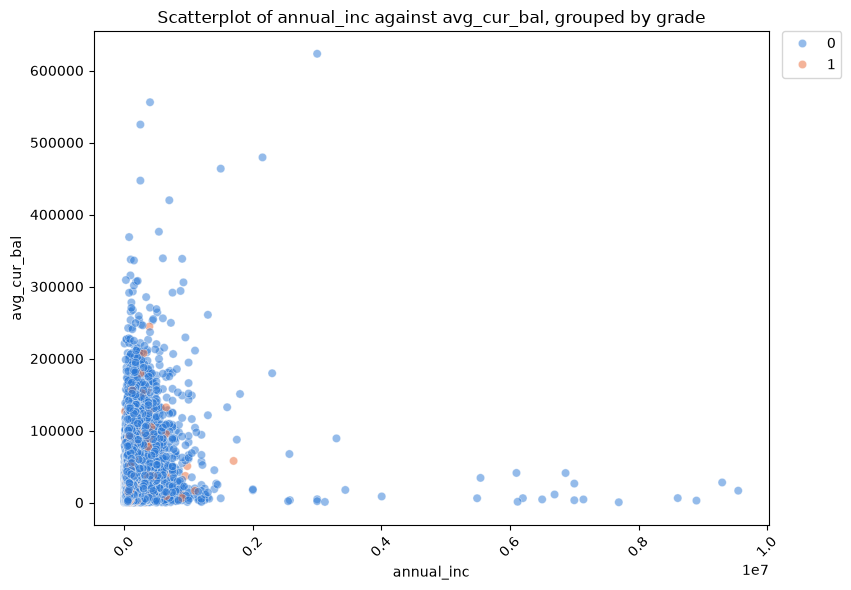

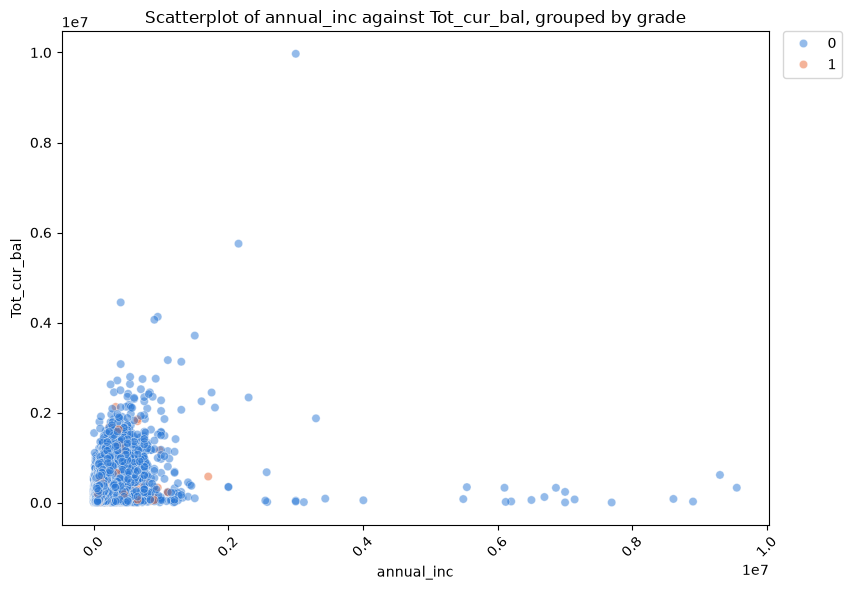

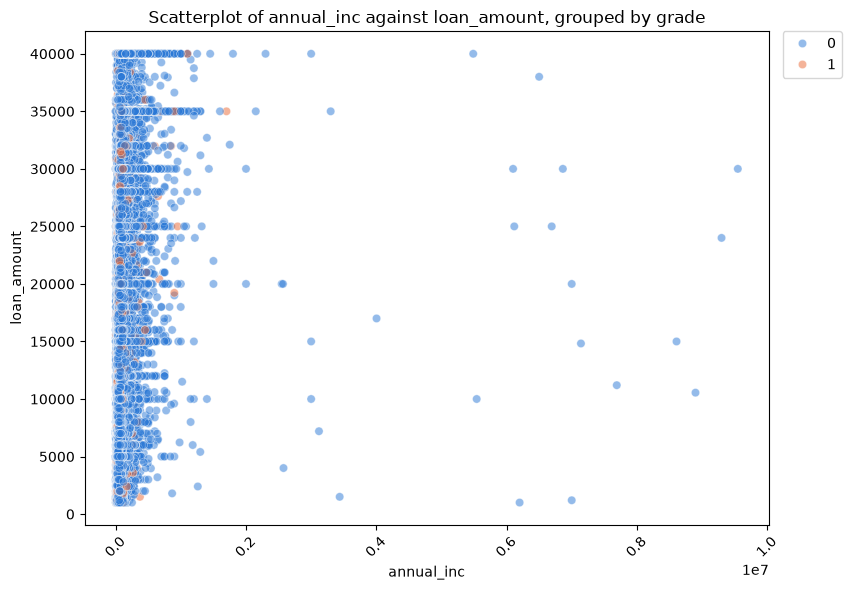

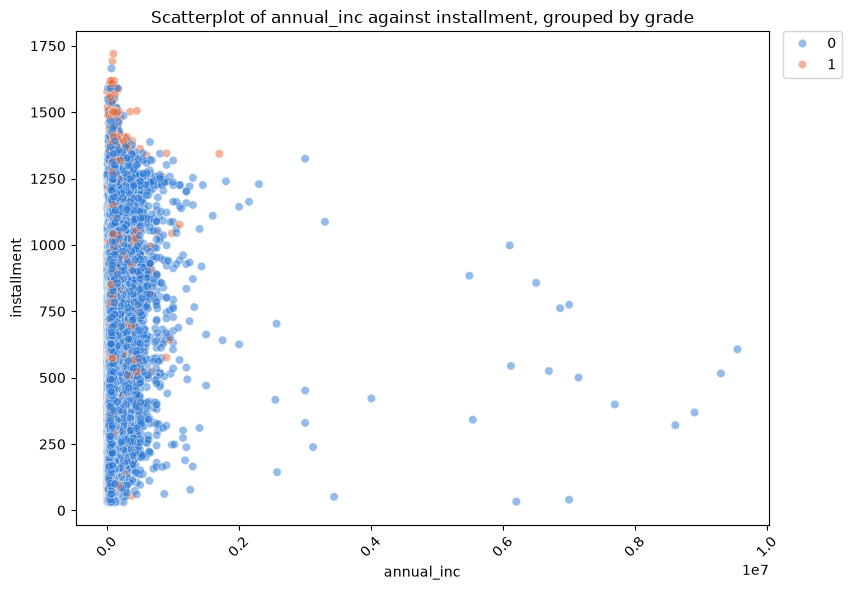

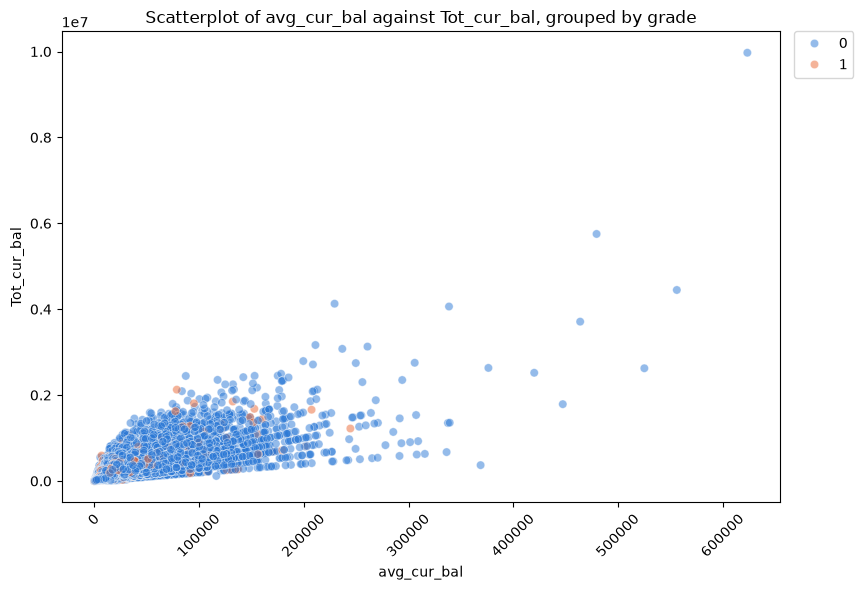

...

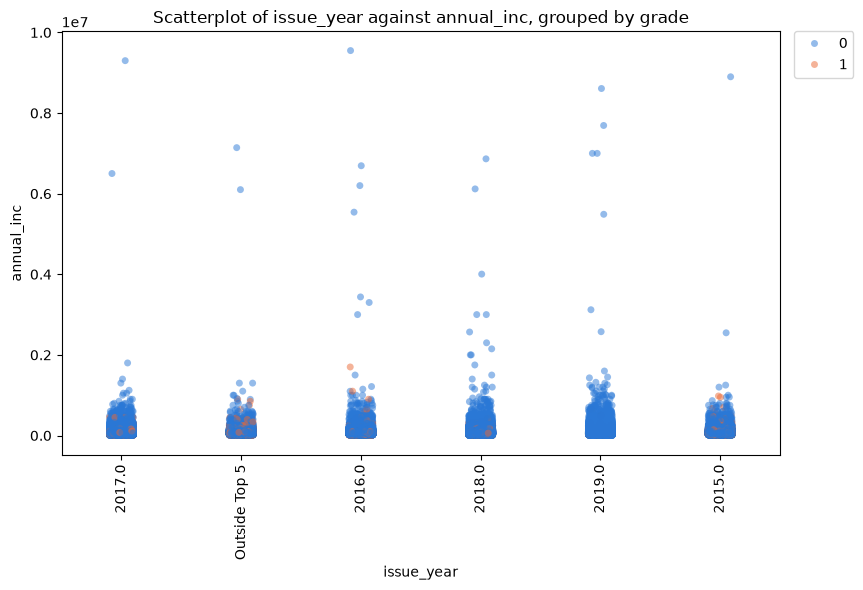

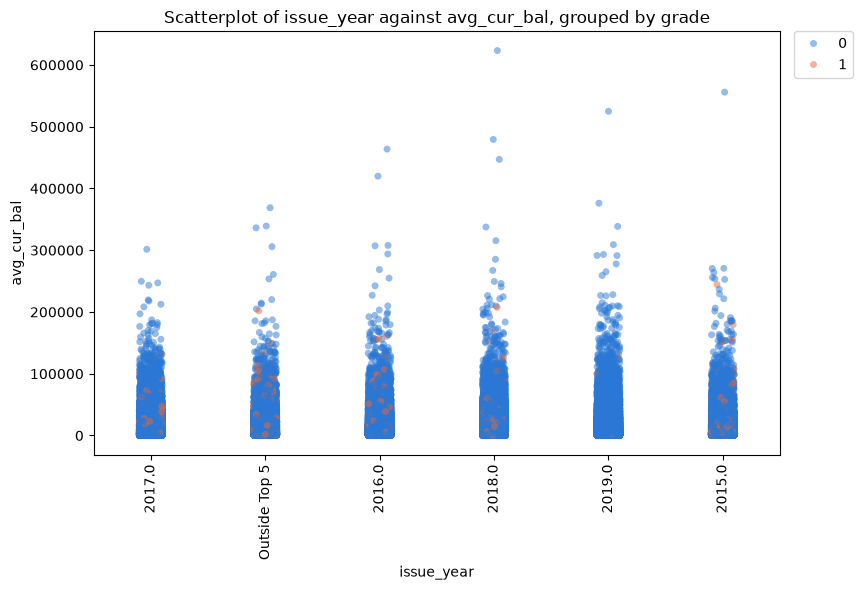

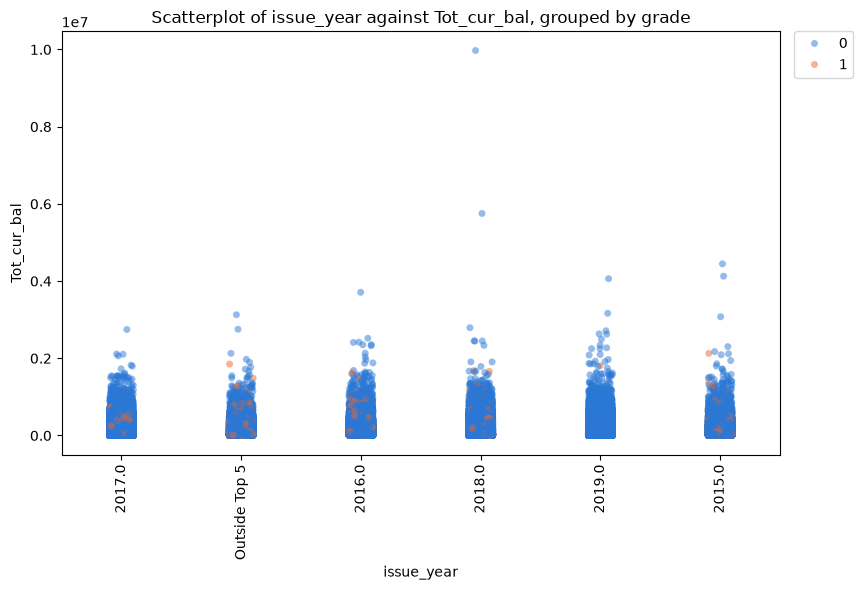

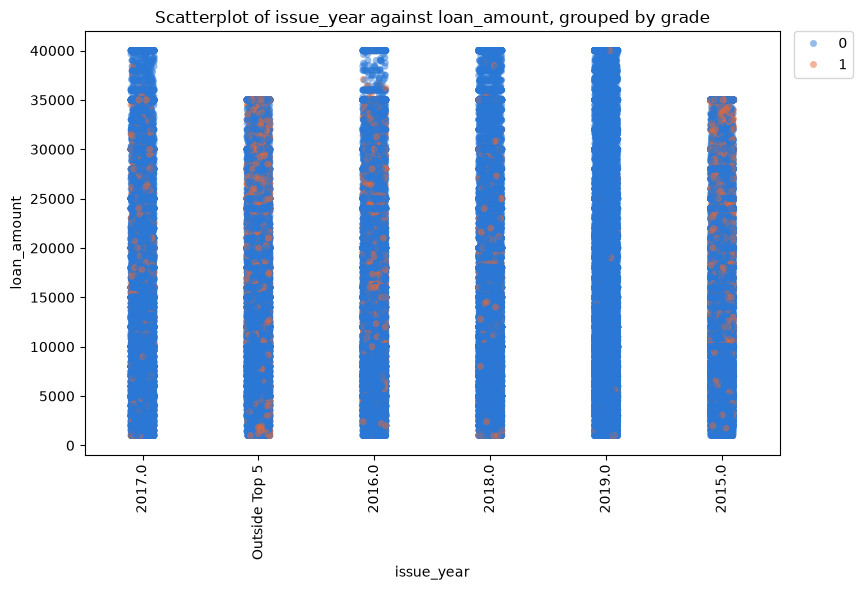

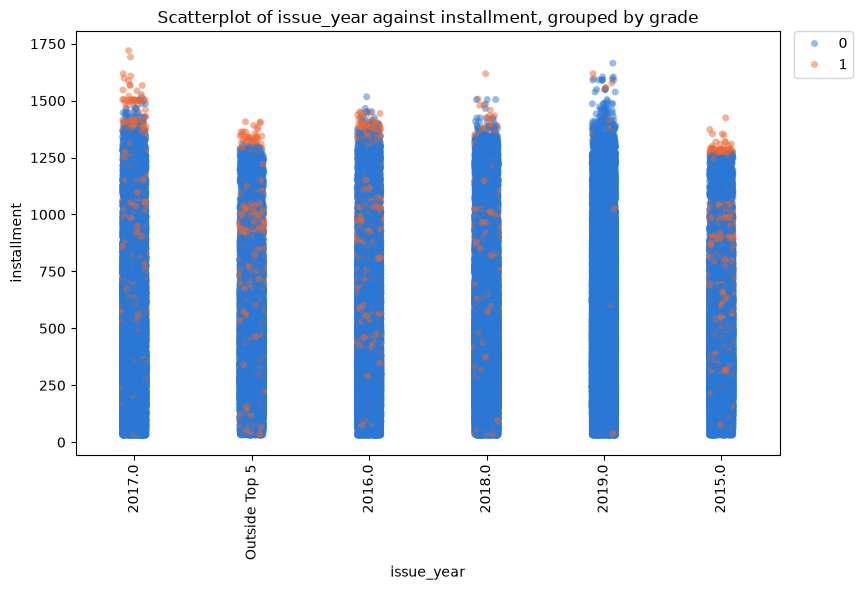

In [11]:
from itertools import combinations

from palette import CATEGORICAL_PALETTE
from univariate_analysis import _binary_classes
from bivariate_analysis import (
    numerical_and_numerical_scatter,
    categorical_and_numerical_scatter,
    categorical_and_categorical_box,
    categorical_and_categorical_count,
)

TARGET_COL = "grade"
BIVARIATE_CAT_COLS = [c for c in CATEGORICAL_COLUMNS if c != TARGET_COL]

majority_class, minority_class = _binary_classes(df, TARGET_COL)
palette = {majority_class: CATEGORICAL_PALETTE[0], minority_class: CATEGORICAL_PALETTE[1]}

#--- numerical x numerical ---
for num_col1, num_col2 in combinations(NUMERICAL_COLUMNS, 2):
    fig, ax = plt.subplots(figsize=(8, 6))
    numerical_and_numerical_scatter(df, num_col1, num_col2, ax=ax, target=TARGET_COL, palette=palette, alpha=0.5)
    plt.show()
    plt.close(fig)

# --- categorical x numerical ---
for cat_col in BIVARIATE_CAT_COLS:
    for num_col in NUMERICAL_COLUMNS:
        fig, ax = plt.subplots(figsize=(8, 6))
        categorical_and_numerical_scatter(
            df, cat_col, num_col, ax=ax, target=TARGET_COL, top_n=5, palette=palette, alpha=0.5, 
        )
        plt.show()
        plt.close(fig)

# --- categorical x categorical ---
# for cat_col1, cat_col2 in combinations(BIVARIATE_CAT_COLS, 2):
#     fig, (ax_rate, ax_count) = plt.subplots(1, 2, figsize=(16, 6))
#     categorical_and_categorical_box(df, cat_col1, cat_col2, ax=ax_rate, target=TARGET_COL)
#     categorical_and_categorical_count(df, cat_col1, cat_col2, ax=ax_count)
#     plt.show()
#     plt.close(fig)

## Next Steps For Analysis

- The numerical columns MUST be winsorised/log-transformed in order to plot a more meaningful distribution. I may even cut it at the 75\% percentile.
- The bivariate columns require a boxplot to put into context the distributions of the current observations. 
- Installment appears to be an important predictor of loan grade that will be included as a factor. But perhaps there is a process meaningful reason why the person is asked to pay some instalment. 
- Current balance columns are basically duplicates and might be worth being dropped. 

Variables that appear to be economically meaningful:
- Installment 
- Term
- Average current balance/total current balance




# First Fit of Maching Learning Model

In [4]:
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import OneHotEncoder

y = df["grade"]
X = df.drop(["grade"], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y)

CATEGORICAL_FEATURES = X.select_dtypes(include="object").columns.tolist()

preprocessor = ColumnTransformer(
    transformers=[("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False), CATEGORICAL_FEATURES)],
    remainder="passthrough",
)

# Fit the encoder on the training split only, to avoid leaking test-set
# categories into the encoding.
X_train_enc = preprocessor.fit_transform(X_train)
X_test_enc = preprocessor.transform(X_test)

C:\Users\trund\AppData\Local\Temp\ipykernel_27140\1578304810.py:13: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  CATEGORICAL_FEATURES = X.select_dtypes(include="object").columns.tolist()


C:\Users\trund\AppData\Local\Temp\ipykernel_7212\3819791355.py:12: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  CATEGORICAL_FEATURES = X.select_dtypes(include="object").columns.tolist()


              precision    recall  f1-score   support

           0       0.94      1.00      0.97     62915
           1       0.89      0.12      0.22      4660

    accuracy                           0.94     67575
   macro avg       0.92      0.56      0.59     67575
weighted avg       0.94      0.94      0.92     67575



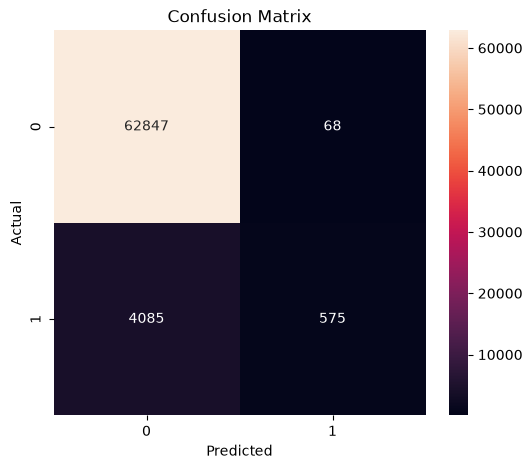

In [ ]:


clf = RandomForestClassifier()
clf.fit(X_train_enc, y_train)

y_pred = clf.predict(X_test_enc)

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=clf.classes_, yticklabels=clf.classes_, ax=ax)
ax.set_title("Confusion Matrix")
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
plt.show()


In [18]:
clf = LogisticRegression(max_iter=10000, solver="saga")
clf.fit(X_train_enc, y_train)

y_pred = clf.predict(X_test_enc)

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=clf.classes_, yticklabels=clf.classes_, ax=ax)
ax.set_title("Confusion Matrix")
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
plt.show()




: 

: 

Comments: 
- The model performed very poorly in identifying customers with Grade 1 loans. The recall score for Grade 1 is 12\%, meaning it only correcly identified 12\% of the Grade 1 Consumers.

# Other Analyses

From distributional plots earlier it was noted that the minimum of the `annual_inc` column was 34 and the minimum of the `avg_cur_bal` was 0.0. These results are strange and could be the result of wrong input so these columns are investigated. 

In [4]:
top_30_inc = np.argsort(df.annual_inc, descending=False)[0:1000]
top_30_entries = df.iloc[top_30_inc, :]

print("=" * 30 + " Dataframe " + "=" * 30)
print(top_30_entries.head(10))
print("=" * 60)
print("\n")

print("=" * 30 + " Grade Value Counts " + "=" * 30)
print(top_30_entries["grade"].value_counts())
print("=" * 60)
print("\n")

print("=" * 30 + " Employment Length Value Counts (Top 5) " + "=" * 30)
print(top_30_entries["emp_length"].value_counts().head(5))
print("=" * 60)


============================== Dataframe ==============================
       emp_length home_ownership  annual_inc verification_status zip_code  \
4381          NaN            OWN        34.0            Verified    255xx   
13769         NaN           RENT       100.0        Not Verified    779xx   
16370         NaN           RENT       200.0     Source Verified    921xx   
267998  10+ years           RENT       200.0        Not Verified    973xx   
3225          NaN       MORTGAGE       223.0            Verified    185xx   
13122         NaN            OWN       300.0        Not Verified    754xx   
9857          NaN       MORTGAGE       445.0        Not Verified    473xx   
12976         NaN            OWN       500.0        Not Verified    750xx   
9970          NaN       MORTGAGE       500.0        Not Verified    480xx   
70760     3 years           RENT       500.0        Not Verified    453xx   

       addr_state  avg_cur_bal  Tot_cur_bal  loan_amount        term  \
4381    

In these entries we clearly see a strong link between `NaN` employment length and having a low `annual_inc`. This strongly suggests that these columns have falsely inputted data.

In [9]:
bottom_bal = np.argsort(df["avg_cur_bal"], descending=False)[:50]
bottom_bal_df = df.iloc[bottom_bal, :]

print("=" * 30 + " Dataframe " + "=" * 30)
print(bottom_bal_df.tail(10))
print("=" * 60)
print("\n")

print("=" * 30 + " Grade Value Counts " + "=" * 30)
print(bottom_bal_df["grade"].value_counts())
print("=" * 60)

print("=" * 30 + " Employment Value Counts " + "=" * 30)
print(bottom_bal_df["emp_length"].value_counts())
print("=" * 60)


============================== Dataframe ==============================
       emp_length home_ownership  annual_inc verification_status zip_code  \
13051         NaN           RENT     20000.0        Not Verified    751xx   
101785    5 years            OWN     82000.0     Source Verified    207xx   
178363   < 1 year       MORTGAGE    240000.0     Source Verified    923xx   
255006  10+ years           RENT     34000.0        Not Verified    900xx   
28195      1 year       MORTGAGE     22000.0     Source Verified    553xx   
82083     4 years           RENT    131058.0        Not Verified    018xx   
136301    7 years           RENT     80000.0            Verified    926xx   
222570  10+ years       MORTGAGE    168000.0     Source Verified    431xx   
125260    6 years       MORTGAGE     34000.0            Verified    922xx   
131224    7 years       MORTGAGE     45661.0            Verified    355xx   

       addr_state  avg_cur_bal  Tot_cur_bal  loan_amount        term  \
13051   

We see for this column that the presence of NaN columns in employment length is not as severe. This suggests that low `avg_cur_bal` is not an indication of wrongly inputted data, and provides further evidence that the bottom entries in `annual_tot_inc` possesses incorrect information. 

We also note from both analyses that the current segregation of `Grade` does not seem very effective. In both cases we expect that as income decreases Grade should generally decrease, which is not what is currently observed here.

# Experiment 1: Removing Top x% of annual_inc

The rationale for this is because the annual_inc column is extremely right skewed with extreme fat tails, and upon further inspection of class segregation, does not appear to provide meaningful information in identifying the Class 1 entries. 



In [57]:
df = pd.read_csv("datasets/25_8.csv").drop(columns=["Tot_cur_bal", "loan_amount"])

# --- drop entries beyond the 85th percentile of annual_inc ---
annual_inc_p85 = df["annual_inc"].quantile(0.85)
df = df[df["annual_inc"] <= annual_inc_p85]

# log transform the "avg_cur_bal column"
df["avg_cur_bal"] = df["avg_cur_bal"].replace(0, np.nan)
df.dropna(inplace=True)
df["avg_cur_bal"] = np.log(df["avg_cur_bal"])

# --- standard scale avg_cur_bal ---
#scaler = StandardScaler()
#df["avg_cur_bal"] = scaler.fit_transform(df[["avg_cur_bal"]])

# --- univariate plots ---
NUMERICAL_COLUMNS = ["annual_inc", "avg_cur_bal", "installment"]
CATEGORICAL_COLUMNS = ["emp_length", "home_ownership", "verification_status", "addr_state", "term", "type", "purpose", "issue_year"]
target_col = "grade"


In [6]:
df = pd.read_csv("datasets/25_8.csv").drop(columns=["Tot_cur_bal", "loan_amount"])

print("=" * 30 + " annual_inc Quantiles " + "=" * 30)
print(df["annual_inc"].quantile([0.01, 0.05, 0.25, 0.5, 0.75, 0.80, 0.85, 0.90, 0.95, 0.99, 0.999]))
print("=" * 60)


============================== annual_inc Quantiles ==============================
0.010     17000.000
0.050     28000.000
0.250     47352.500
0.500     66000.000
0.750     95000.000
0.800    103324.800
0.850    117500.000
0.900    133000.000
0.950    166610.700
0.990    276000.000
0.999    624495.612
Name: annual_inc, dtype: float64


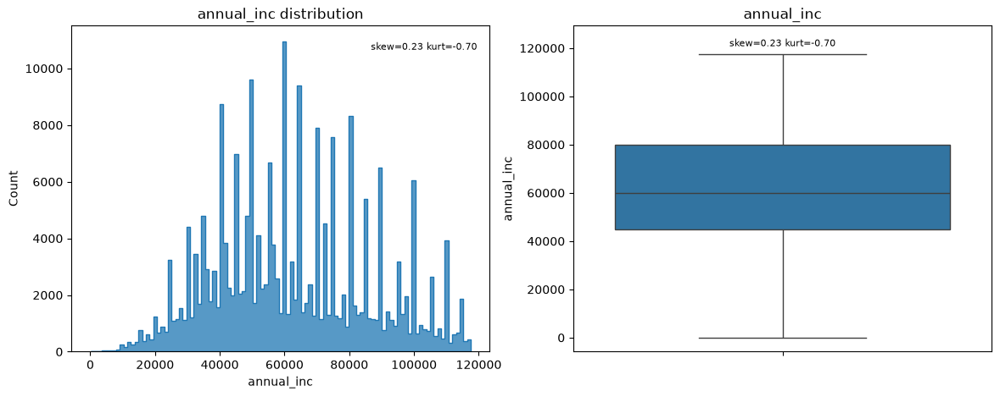

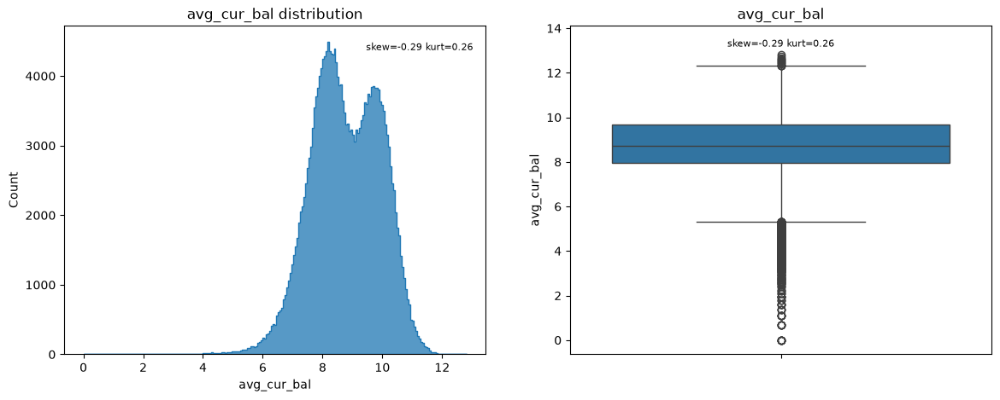

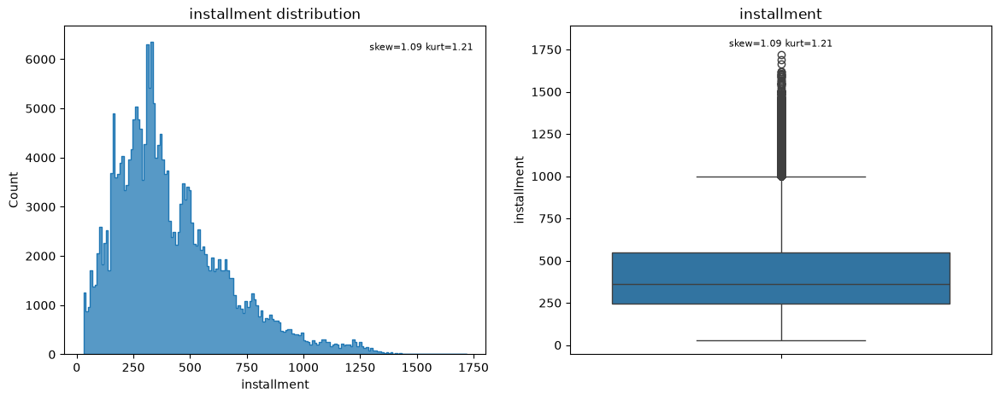

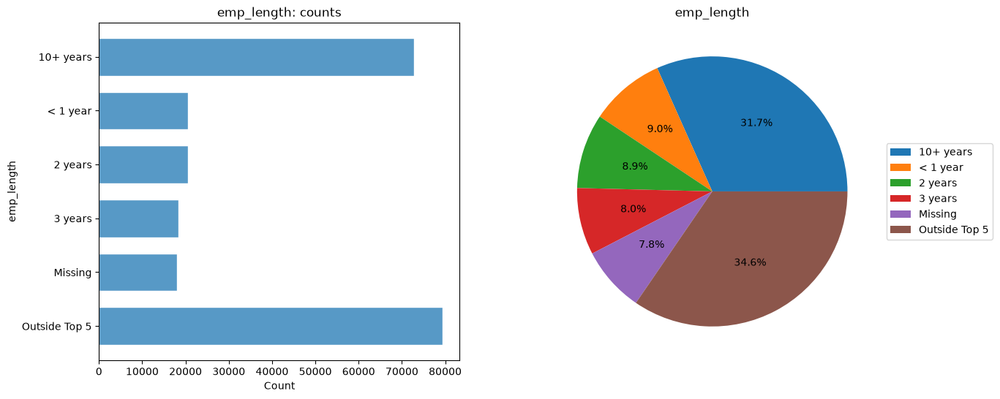

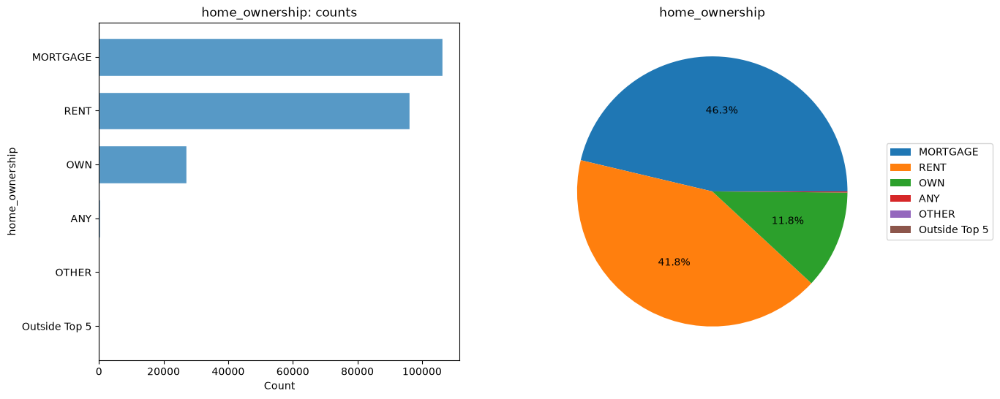

...

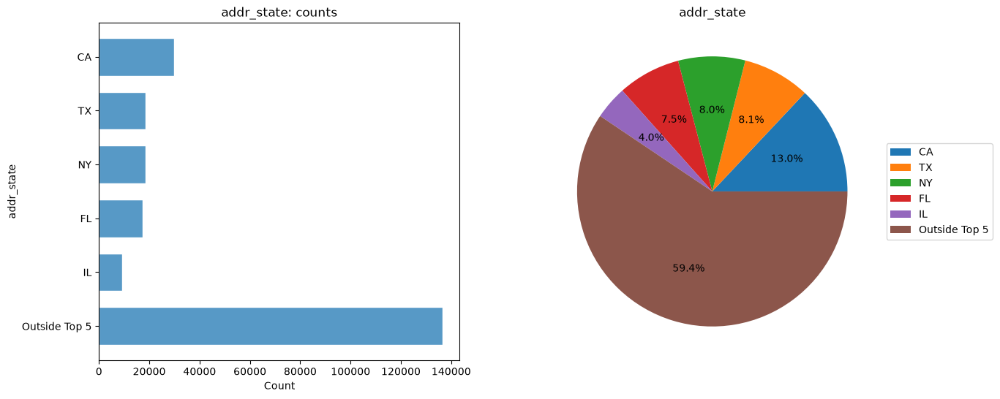

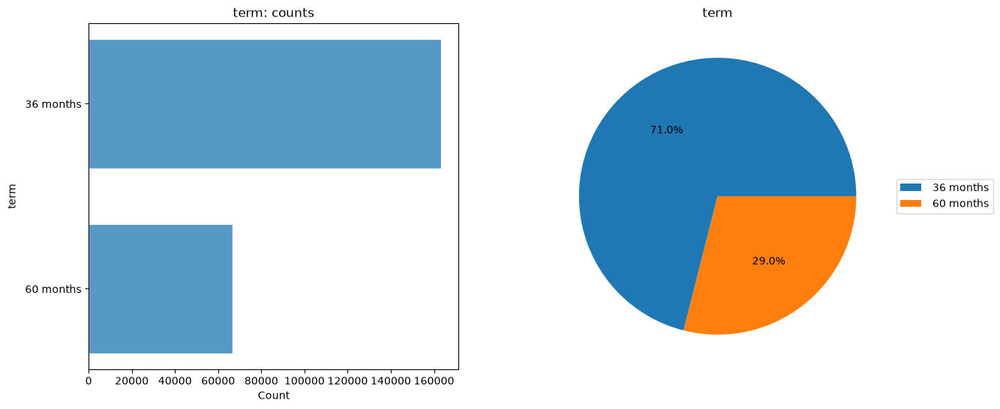

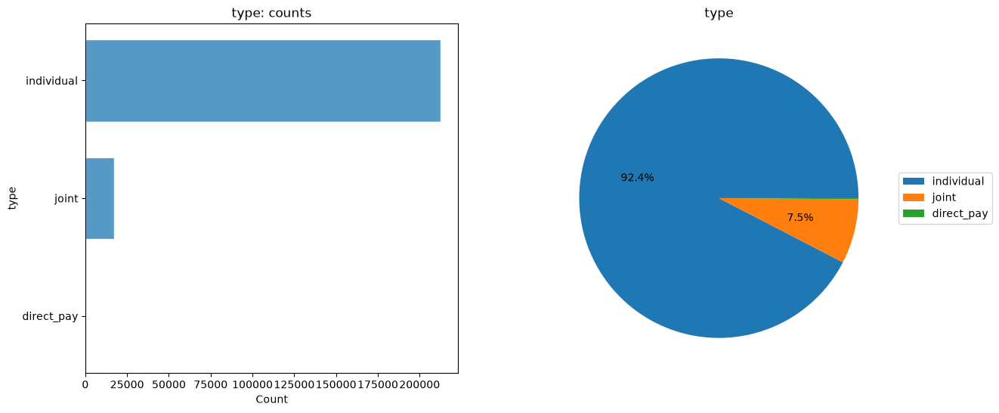

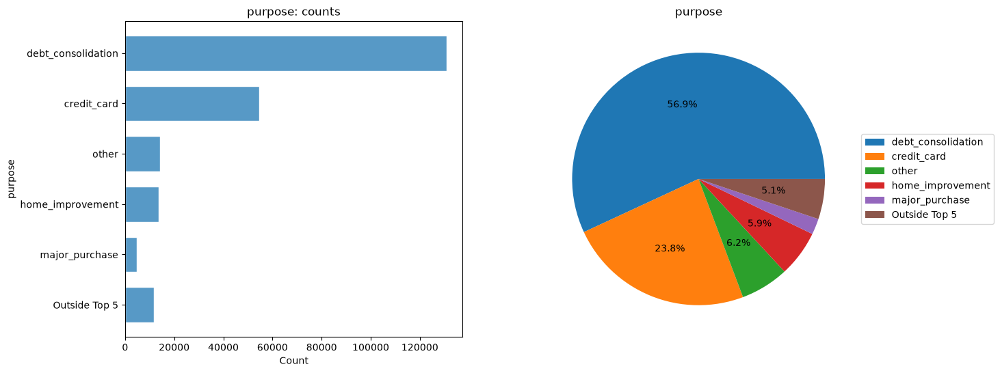

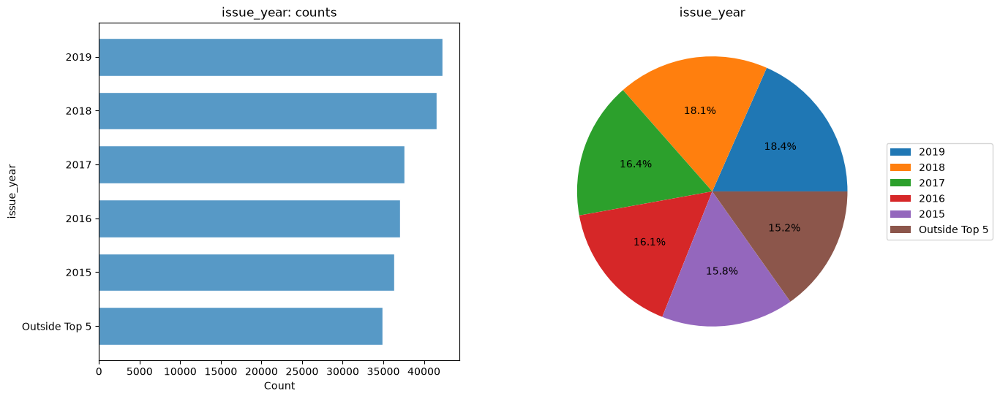

In [58]:
for num_col in NUMERICAL_COLUMNS:
    fig, (hist_ax, box_ax) = plt.subplots(1, 2, figsize=(14, 5))
    histogram_by_class(df, num_col, ax=hist_ax)
    boxplot_by_class(df, num_col, ax=box_ax)
    plt.show()
    plt.close(fig)

for cat_col in CATEGORICAL_COLUMNS:
    fig, (bar_ax, pie_ax) = plt.subplots(1, 2, figsize=(14, 6))
    bar_chart(df, cat_col, ax=bar_ax, top_n=5)
    pie_chart(df, cat_col, ax=pie_ax, top_n=5, autopct=lambda p: f"{p:.1f}%" if p >= 3 else "")
    plt.show()
    plt.close(fig)


Comments on Each Column:
- `annual_inc` - multimodal, after removal of the top 15% much better skew and kurtosis (now ligher tails than normal)
- $\log$(`avg_cur_bal`) - a bimodal distribution with low skew and kurtosis
- `installment` - noticable right skew with fatter tails than normal distribution. 
- `emp_length` majority are 10+ years but quite balanced between the other categories.
- `home_ownership` - quite balanced between the top 2 categories, but the other categories take a very small minority
- `verification_status` - relatively well balanced category 
- `state` - quite evenly split across the top 5 columns, but there are states that take a very small proportion only.  
- `term` - there is a clear majority in 36 month loans
- `type` - vast majority are individual loans
- `purpose` - majority of purpose is for credit related purposes (debt_consolidation, credit_card), categories beyond top 5 are generally quite well balanced with the other categories barring the top 2 categories. 
- `issue_year` - generally well balanced category across most lending years (barring 2012 and 2013). The amount of loans recorded in each year is increasing monotonically. 

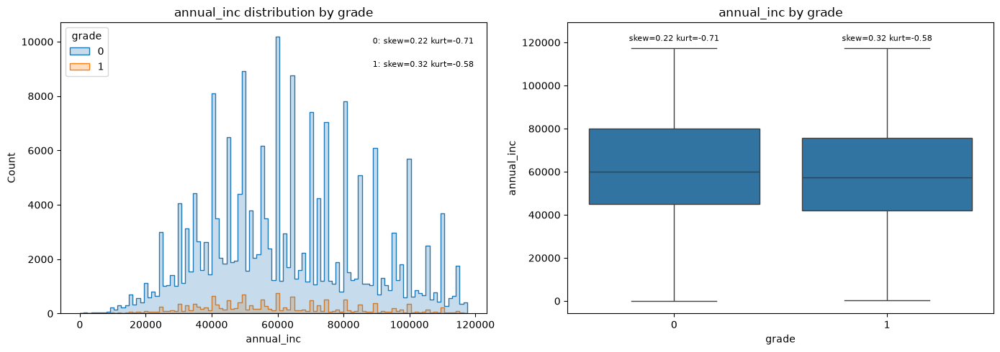

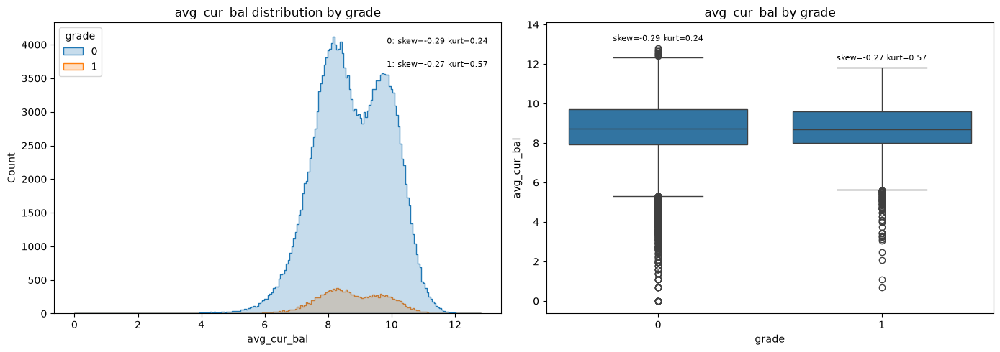

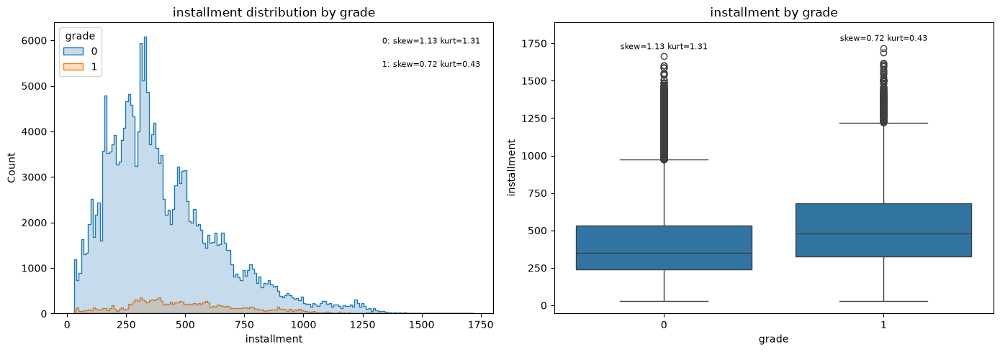

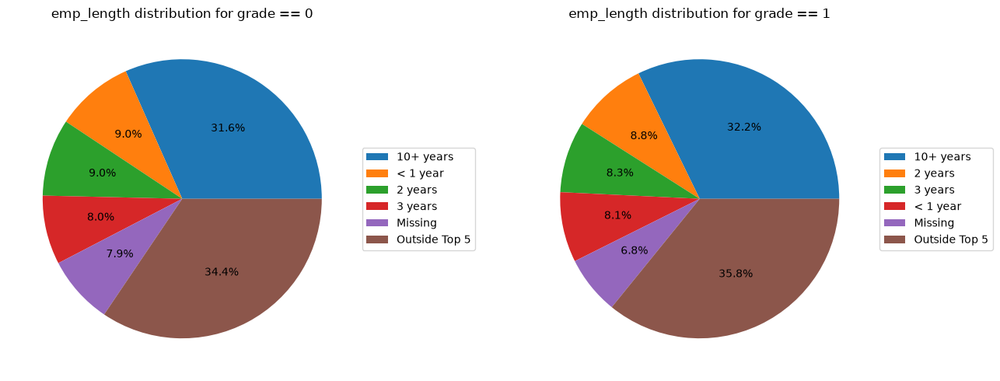

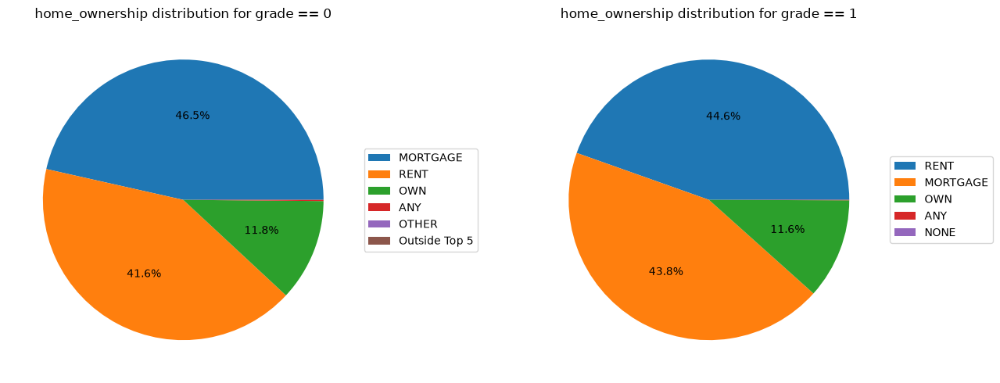

...

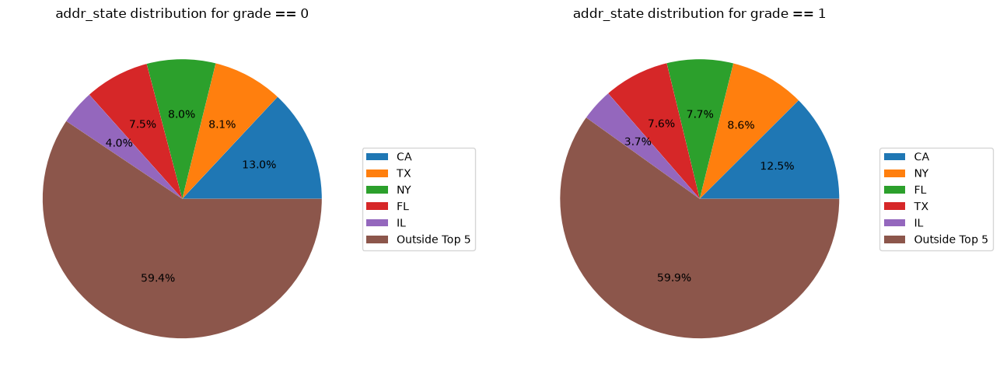

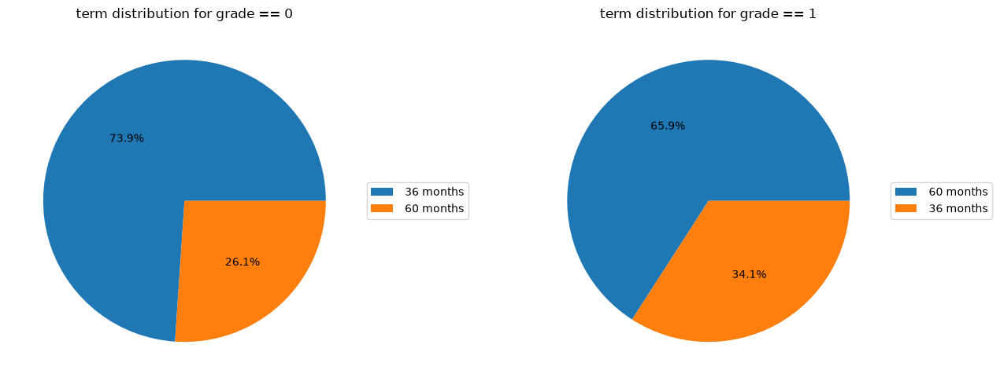

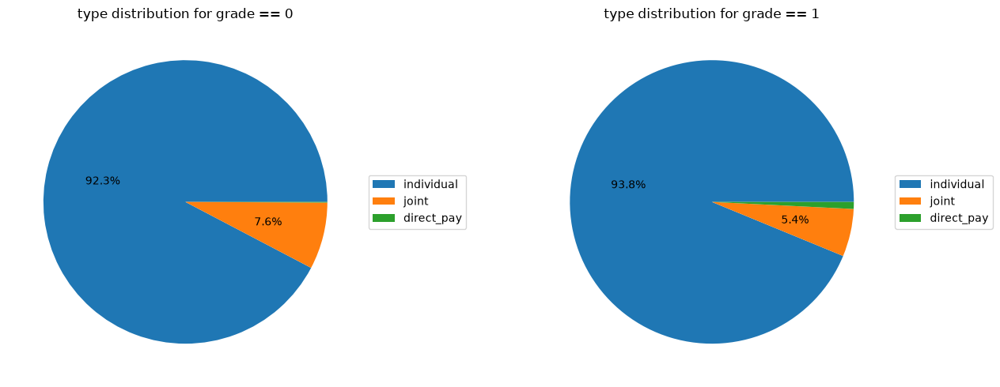

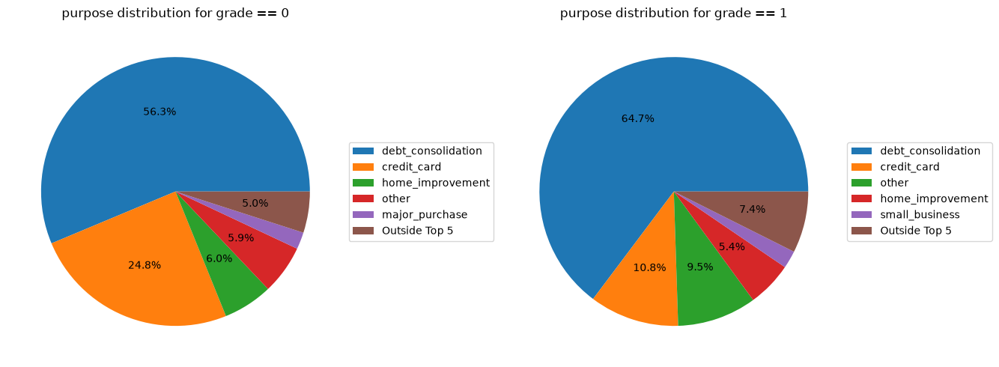

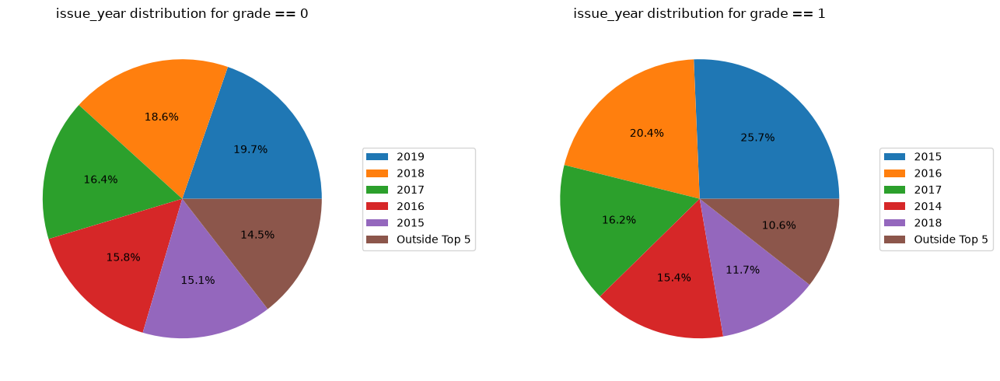

In [ ]:
from univariate_analysis import _binary_classes
from palette import CATEGORICAL_PALETTE

target_col = "grade"
majority_class, minority_class = _binary_classes(df, target_col)
palette = {majority_class: CATEGORICAL_PALETTE[0], minority_class: CATEGORICAL_PALETTE[1]}

for num_col in NUMERICAL_COLUMNS:
    fig, ax = plt.subplots(1, 2, figsize=(14,5))
    histogram_by_class(df, num_col, ax=ax[0], target_col=target_col)
    boxplot_by_class(df, num_col, ax=ax[1], target_col=target_col)
    plt.tight_layout()
    plt.show()

for cat_col in CATEGORICAL_COLUMNS:
    fig, ax = plt.subplots(1, 2, figsize=(14,5))
    #bar_chart(df, cat_col, ax[0], target_col = "grade", top_n=5, palette = palette)
    pie_chart(df[df[target_col] == 0], cat_col, ax=ax[0], top_n=5, autopct=lambda p: f"{p:.1f}%" if p >= 3 else "")
    pie_chart(df[df[target_col] == 1], cat_col, ax=ax[1], top_n=5, autopct=lambda p: f"{p:.1f}%" if p >= 3 else "")

    ax[0].set_title(f"{cat_col} distribution for {target_col} == 0")
    ax[1].set_title(f"{cat_col} distribution for {target_col} == 1")
    plt.tight_layout()
    #plt.savefig(f"documentation/figures/compare_with_pred/{cat_col}.png")
    plt.show()

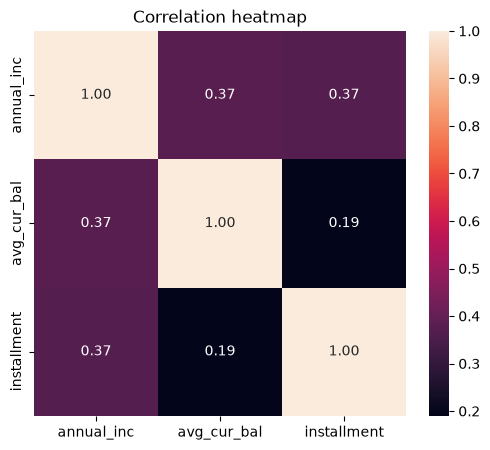

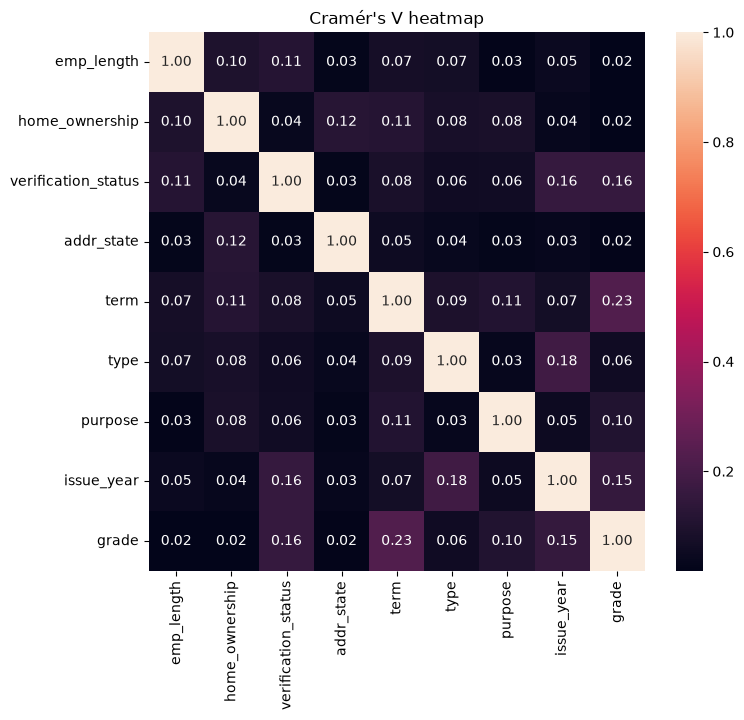

In [6]:
from correlations import correlation_heatmap, cramers_v_heatmap

fig, ax = plt.subplots(figsize=(6, 5))
correlation_heatmap(df[NUMERICAL_COLUMNS], ax=ax, annot=True, fmt=".2f")
plt.show()
plt.close(fig)

fig, ax = plt.subplots(figsize=(8, 7))
cramers_v_heatmap(df[CATEGORICAL_COLUMNS], ax=ax, annot=True, fmt=".2f")
plt.show()
plt.close(fig)


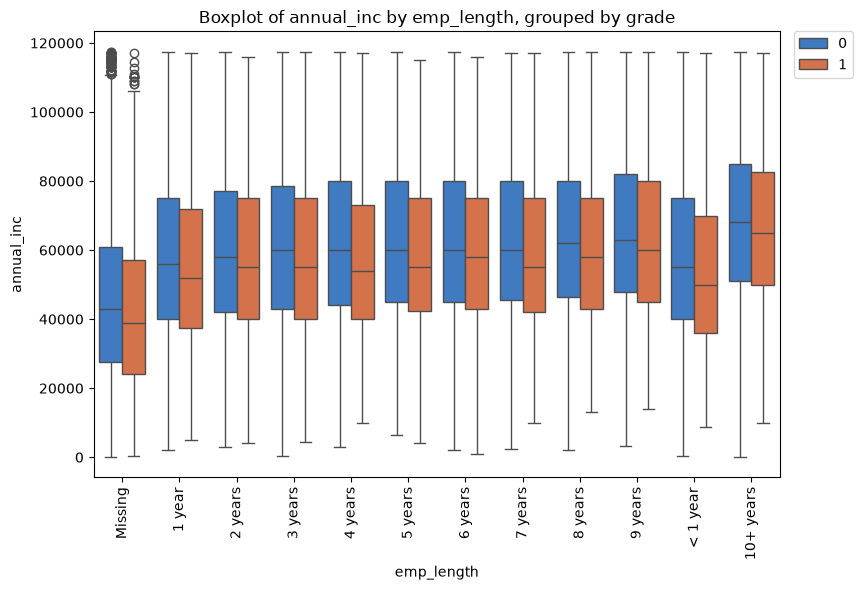

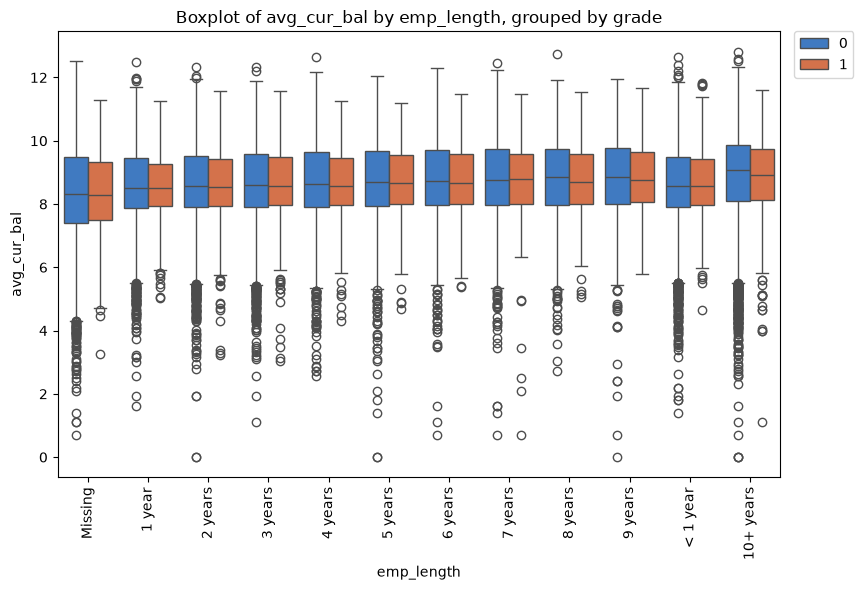

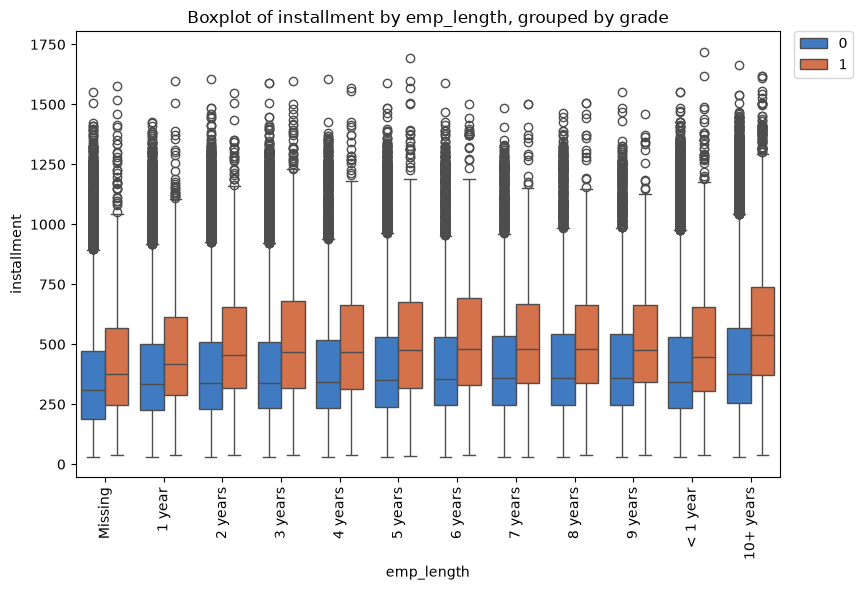

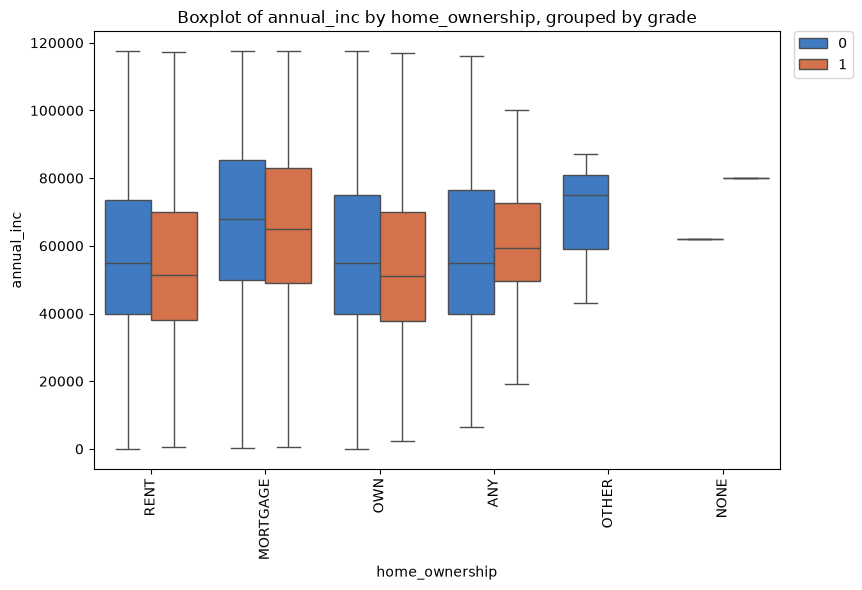

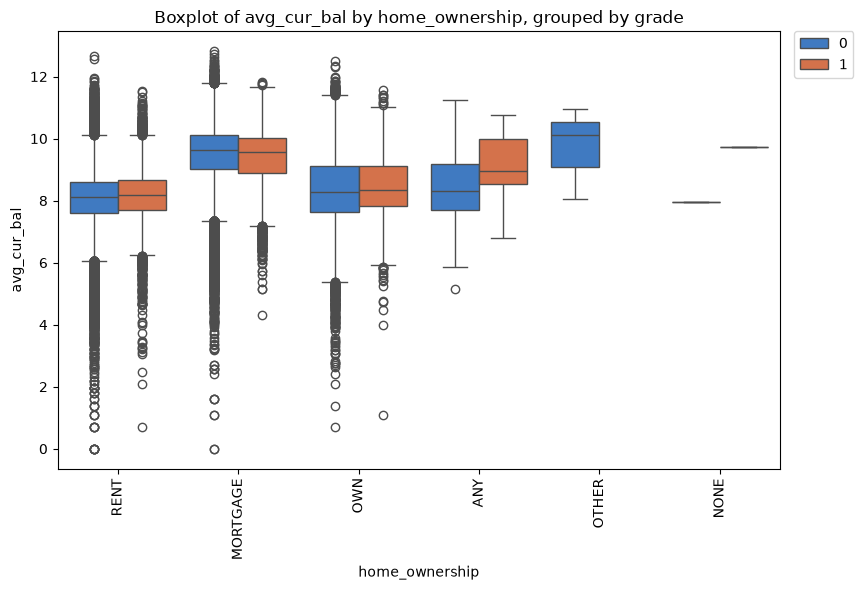

...

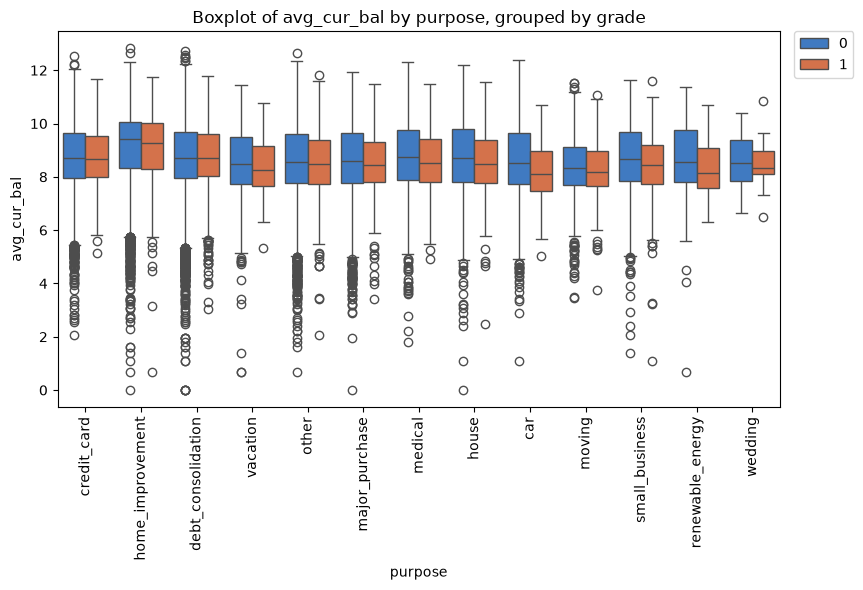

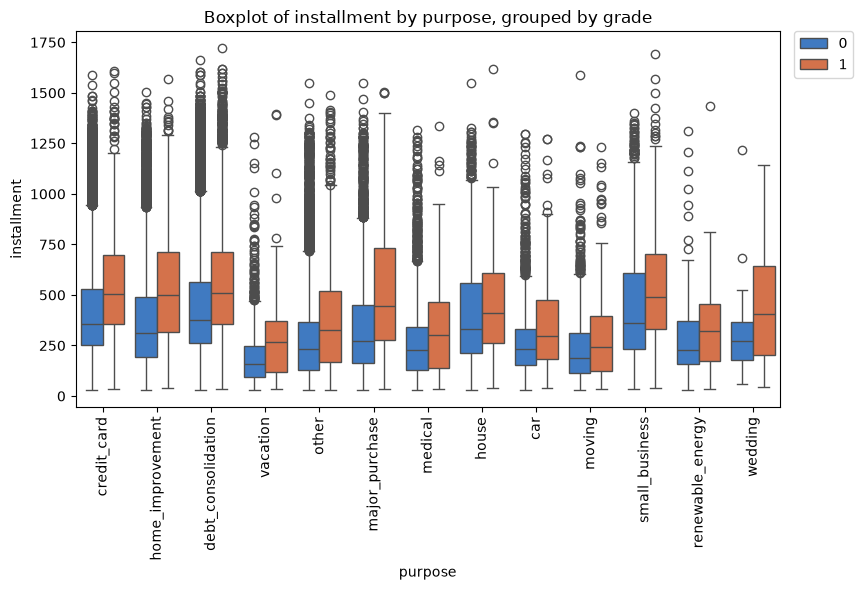

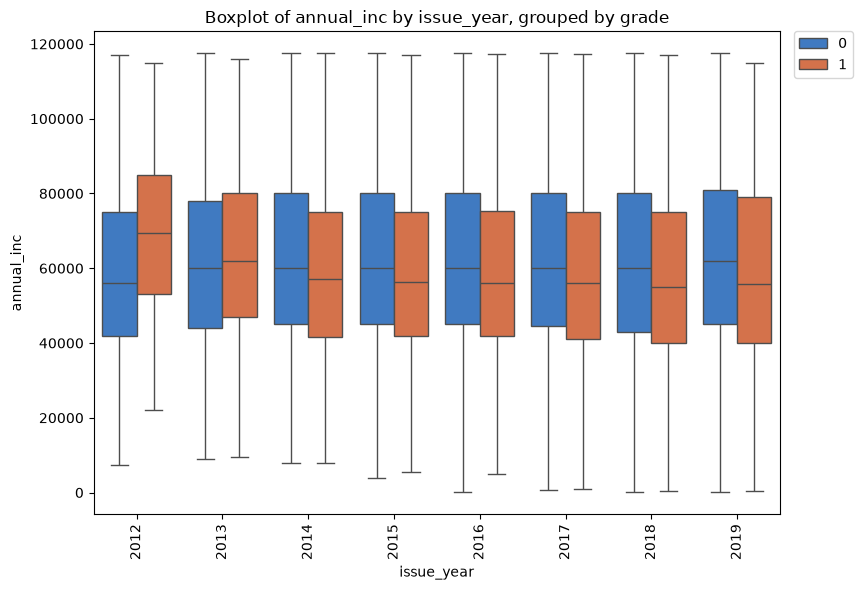

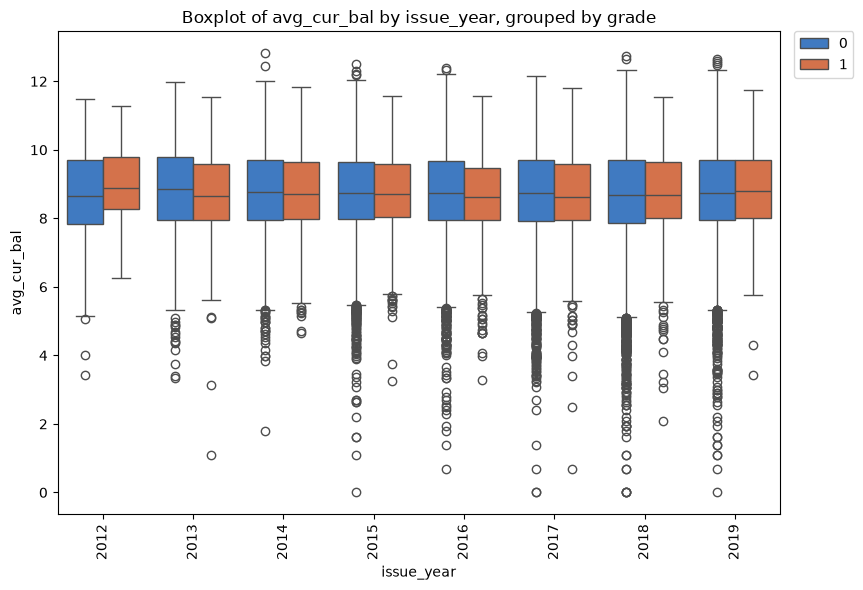

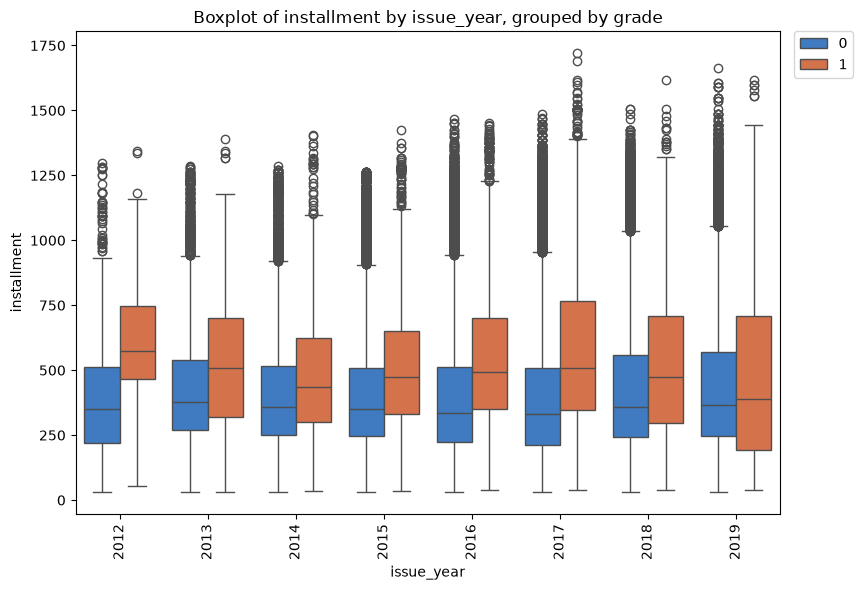

In [7]:
from bivariate_analysis import categorical_and_numerical_boxplot
from univariate_analysis import _binary_classes

TARGET_COL = "grade"
BIVARIATE_CAT_COLS = [c for c in CATEGORICAL_COLUMNS if c != TARGET_COL]

from palette import CATEGORICAL_PALETTE
from univariate_analysis import _binary_classes
from bivariate_analysis import (
    numerical_and_numerical_scatter,
    categorical_and_numerical_scatter,
    categorical_and_categorical_box,
    categorical_and_categorical_count,
)

TARGET_COL = "grade"
BIVARIATE_CAT_COLS = [c for c in CATEGORICAL_COLUMNS if c != TARGET_COL]

majority_class, minority_class = _binary_classes(df, TARGET_COL)
palette = {majority_class: CATEGORICAL_PALETTE[0], minority_class: CATEGORICAL_PALETTE[1]}

majority_class, minority_class = _binary_classes(df, TARGET_COL)
palette = {majority_class: CATEGORICAL_PALETTE[0], minority_class: CATEGORICAL_PALETTE[1]}

for cat_col in BIVARIATE_CAT_COLS:
    for num_col in NUMERICAL_COLUMNS:
        fig, ax = plt.subplots(figsize=(8, 6))
        categorical_and_numerical_boxplot(df, cat_col, num_col, ax=ax, target=TARGET_COL, palette=palette)
        plt.show()
        plt.close(fig)


## ML Training


In [20]:
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression 
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import OneHotEncoder

y = df["grade"]
X = df.drop(["grade"], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y)

CATEGORICAL_FEATURES = X.select_dtypes(include="object").columns.tolist()

preprocessor = ColumnTransformer(
    transformers=[("onehot", OneHotEncoder(handle_unknown="ignore"), CATEGORICAL_FEATURES)],
    remainder="passthrough",
)

# Fit the encoder on the training split only, to avoid leaking test-set
# categories into the encoding.
X_train_enc = preprocessor.fit_transform(X_train)
X_test_enc = preprocessor.transform(X_test)

C:\Users\trund\AppData\Local\Temp\ipykernel_14352\4263989563.py:13: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  CATEGORICAL_FEATURES = X.select_dtypes(include="object").columns.tolist()


              precision    recall  f1-score   support

           0       0.93      1.00      0.97     53288
           1       0.79      0.11      0.19      4155

    accuracy                           0.93     57443
   macro avg       0.86      0.55      0.58     57443
weighted avg       0.92      0.93      0.91     57443



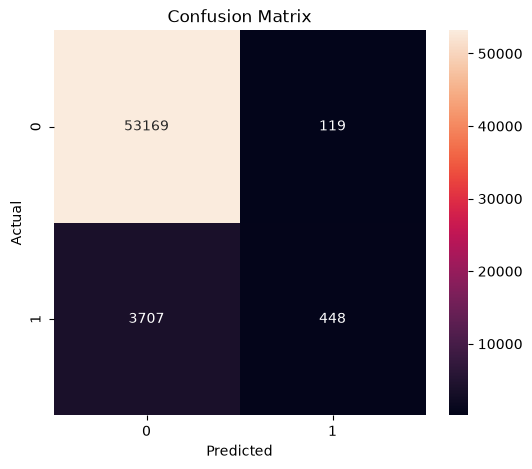

In [ ]:
import joblib
from pathlib import Path
from sklearn.metrics import roc_curve, roc_auc_score

MODEL_DIR = Path("models")
clf = joblib.load(MODEL_DIR / "random_forest_classifier.joblib")

# The positive class is "1" (Grade 1 / Inferior) - predict_proba's column
# order follows clf.classes_, so locate it explicitly rather than assuming
# index 1.
y_score = clf.predict_proba(X_test_enc)[:, 1]
y_pred = (y_score > 0.50) *  1

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=clf.classes_, yticklabels=clf.classes_, ax=ax)
ax.set_title("Confusion Matrix")
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
plt.show()


============================== correctly_predicted Value Counts ==============================
correctly_predicted
0    3707
1     448
Name: count, dtype: int64


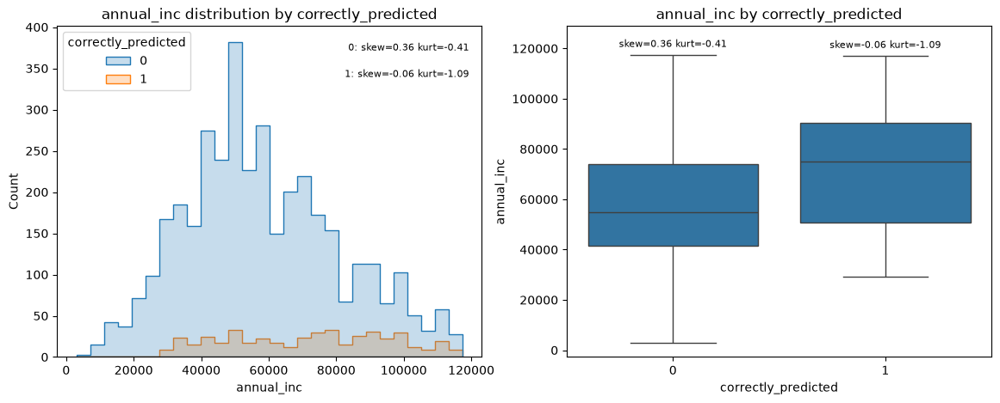

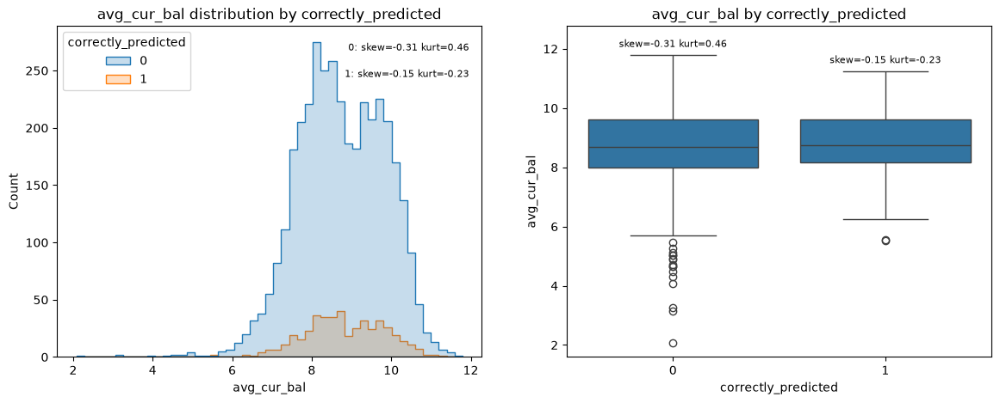

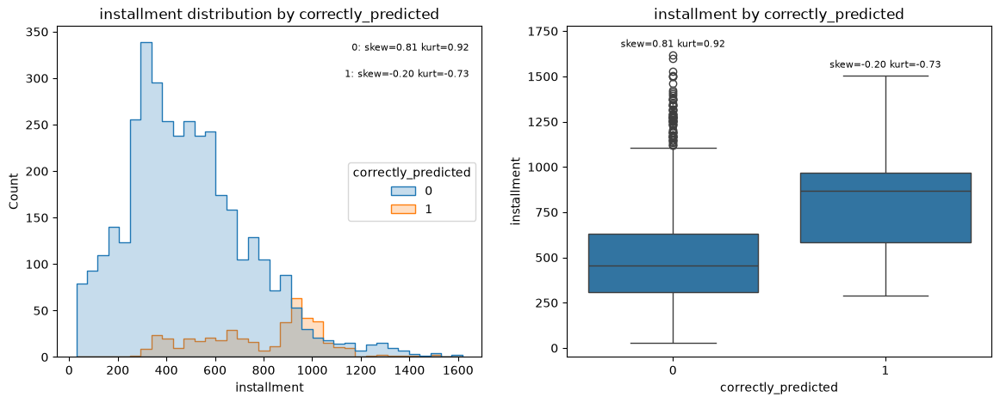

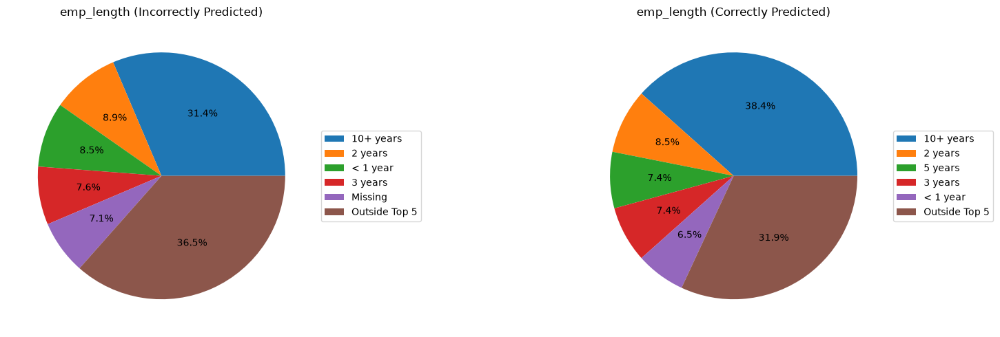

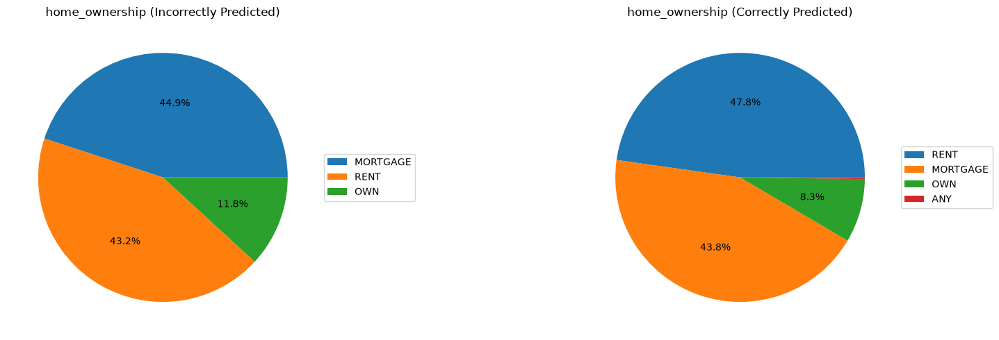

...

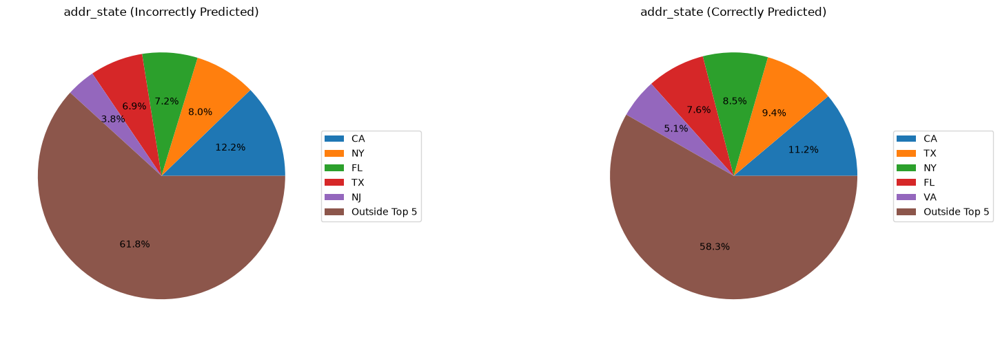

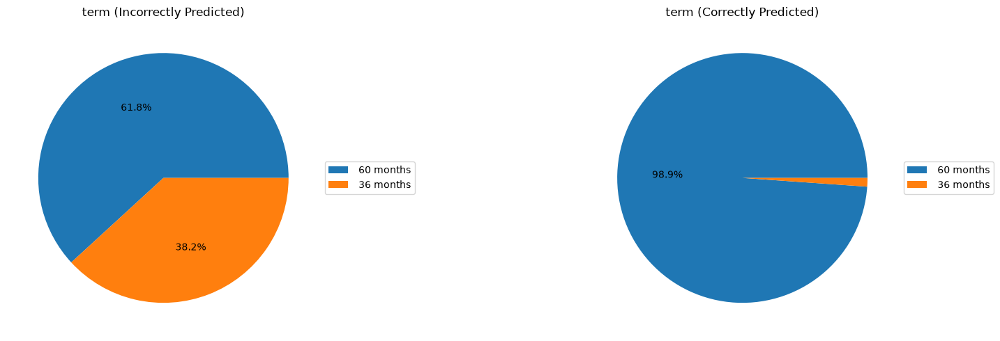

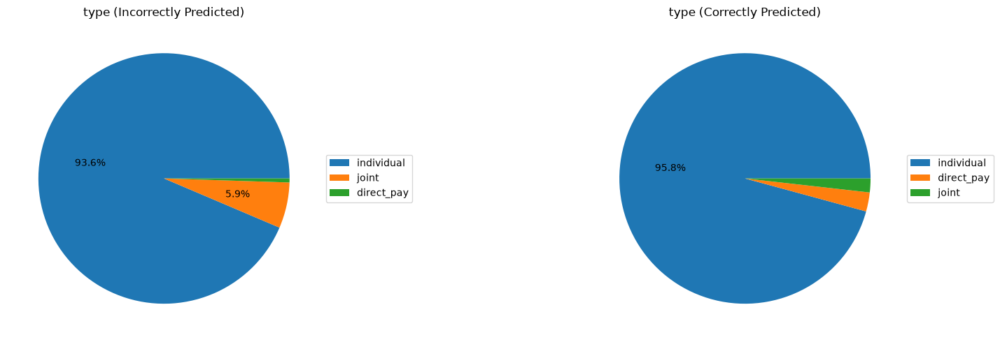

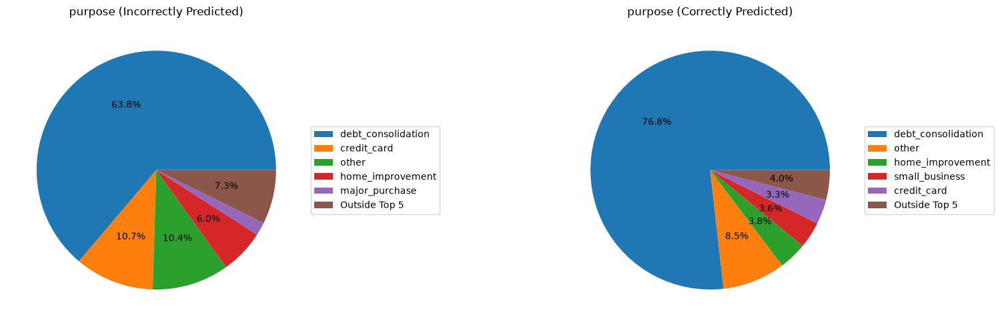

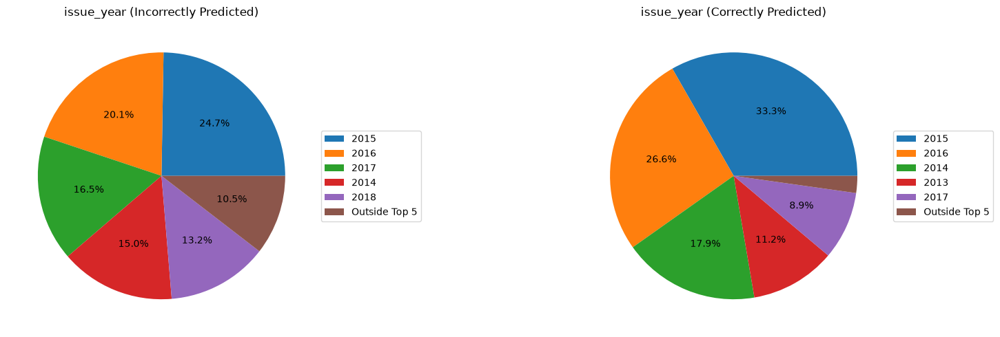

In [52]:
prediction_df = X_test.copy()
prediction_df["actual_label"] = y_test.values
prediction_df["predicted_label"] = y_pred

actual_class_1_df = prediction_df[prediction_df["actual_label"] == 1].copy()
actual_class_1_df["correctly_predicted"] = (
    actual_class_1_df["predicted_label"] == actual_class_1_df["actual_label"]
).map({True: "1", False: "0"})

print("=" * 30 + " correctly_predicted Value Counts " + "=" * 30)
print(actual_class_1_df["correctly_predicted"].value_counts())
print("=" * 60)

for num_col in NUMERICAL_COLUMNS:
    fig, (hist_ax, box_ax) = plt.subplots(1, 2, figsize=(14, 5))
    histogram_by_class(actual_class_1_df, num_col, ax=hist_ax, target_col="correctly_predicted")
    boxplot_by_class(actual_class_1_df, num_col, ax=box_ax, target_col="correctly_predicted")
    plt.show()
    plt.close(fig)

cat_columns = CATEGORICAL_COLUMNS.copy()
for cat_col in cat_columns:
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))
    #bar_chart(actual_class_1_df, cat_col, ax=ax[0], target_col="correctly_predicted", top_n=7)
    pie_chart(actual_class_1_df[actual_class_1_df["correctly_predicted"] == "0"], cat_col, ax=ax[0], top_n=5, autopct=lambda p: f"{p:.1f}%" if p >= 3 else "")
    pie_chart(actual_class_1_df[actual_class_1_df["correctly_predicted"] == "1"], cat_col, ax=ax[1], top_n=5, autopct=lambda p: f"{p:.1f}%" if p >= 3 else "")
    ax[0].set_title(f"{cat_col} (Incorrectly Predicted)")
    ax[1].set_title(f"{cat_col} (Correctly Predicted)")
    plt.tight_layout()
    plt.savefig(f"documentation/figures/compare_with_pred/pred/{cat_col}_pred.png")
    plt.show()
    plt.close(fig)


The first thing to observe is that in the full dataset, there was no distinction in the `annual_inc` distributions between Grade 0 and Grade 1. However, the model seems to bias predicting Grade 1 for consumers with higher `annual_inc`, and that logic does not seem to make sense - higher income consumers should in theory be better at paying off their loans. 

Similarly, `installments` appear to have no correlation with being in Grade 0 or Grade 1, but the model ends up determining installments as an important feature for prediction. 

Further comments are due on the difference in distributions between actual grade 0 and grade 1 and also the predicted distributions for grade 0 and grade 1. 
- `debt_consolidation's` percentage in the correctly predicted data is significantly higher than the wrongly predicted data, increasing from 63.8\% to 76.8\%. A magnitude of lower increase is observed in the actual data, suggesting that the model uses debt_consolidation as a relatively important feature. 

## ML Improvement 1

After obtaining suggestions from the web, the approach suggested seems to be to redo the plots with a lower acceptance probability threshold, which the subsection below addresses.



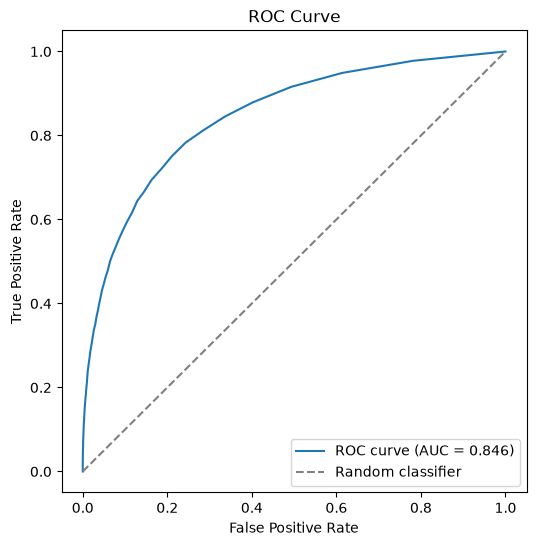

AUC: 0.8459
              precision    recall  f1-score   support

           0       0.96      0.91      0.94     53288
           1       0.33      0.55      0.42      4155

    accuracy                           0.89     57443
   macro avg       0.65      0.73      0.68     57443
weighted avg       0.92      0.89      0.90     57443



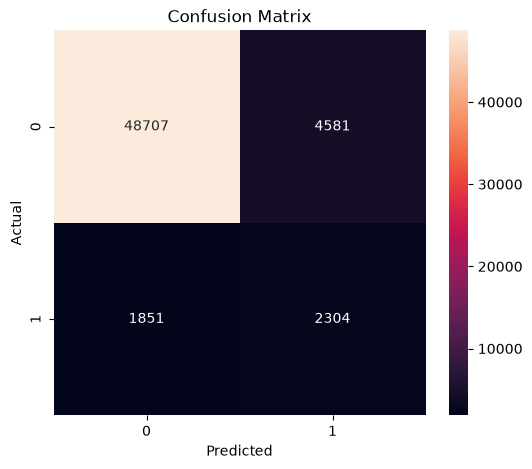

In [55]:
threshold = 0.15

import joblib
from pathlib import Path
from sklearn.metrics import roc_curve, roc_auc_score

MODEL_DIR = Path("models")
clf = joblib.load(MODEL_DIR / "random_forest_classifier.joblib")

# The positive class is "1" (Grade 1 / Inferior) - predict_proba's column
# order follows clf.classes_, so locate it explicitly rather than assuming
# index 1.
y_score = clf.predict_proba(X_test_enc)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_score)
auc = roc_auc_score(y_test, y_score)

fig, ax = plt.subplots(figsize=(6, 6))
ax.plot(fpr, tpr, label=f"ROC curve (AUC = {auc:.3f})")
ax.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random classifier")
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.set_title("ROC Curve")
ax.legend(loc="lower right")
plt.show()
plt.close(fig)

print(f"AUC: {auc:.4f}")


y_pred = (y_score > threshold) *  1

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=clf.classes_, yticklabels=clf.classes_, ax=ax)
ax.set_title("Confusion Matrix")
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
plt.show()


============================== correctly_predicted Value Counts ==============================
correctly_predicted
1    2304
0    1851
Name: count, dtype: int64


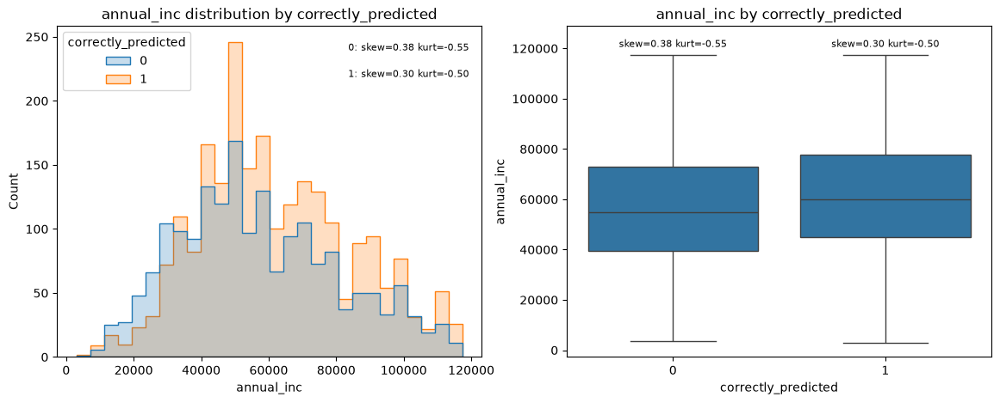

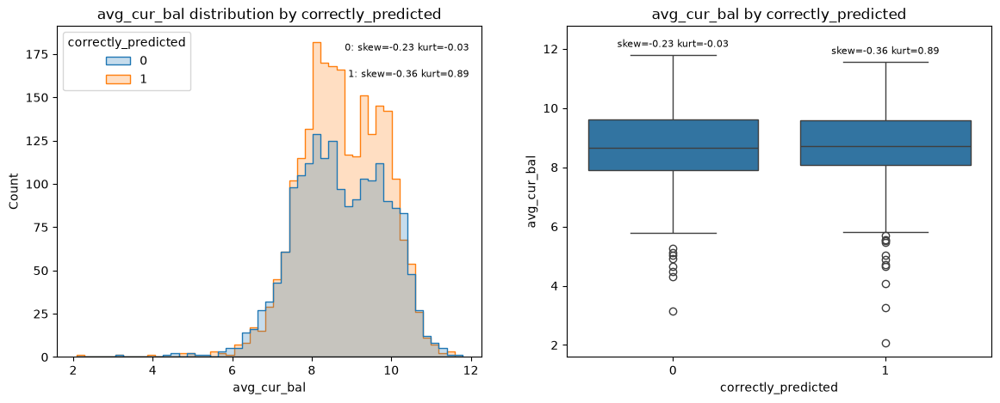

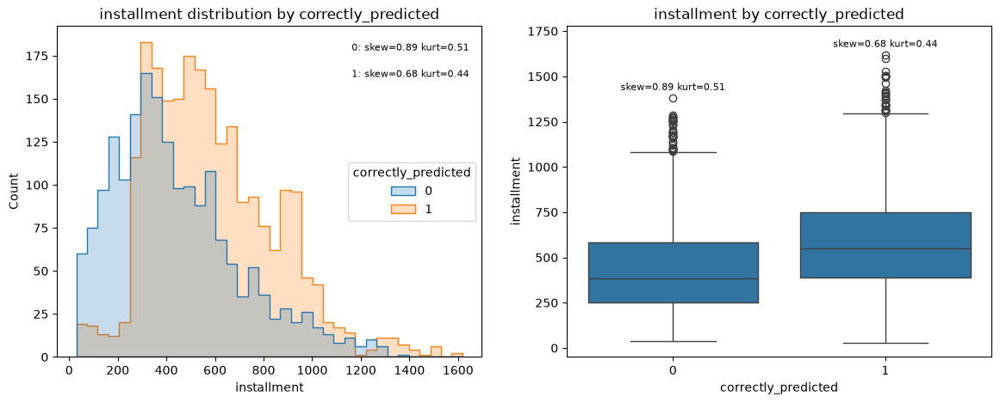

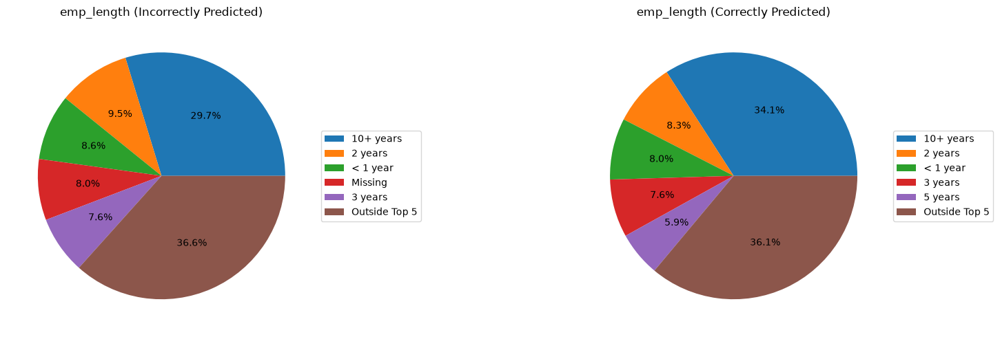

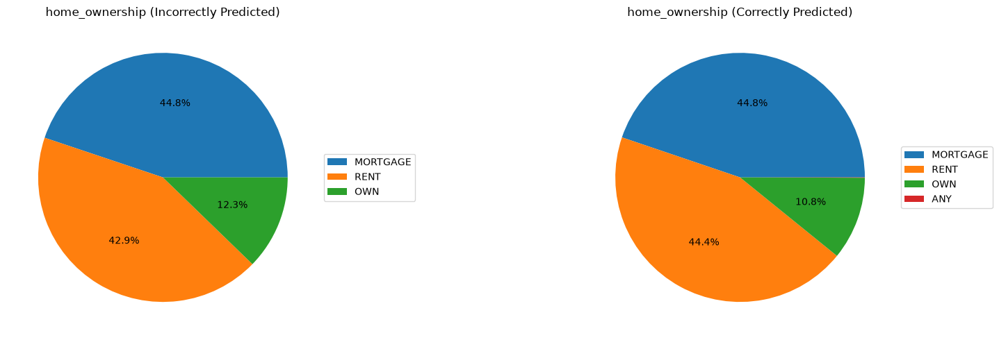

...

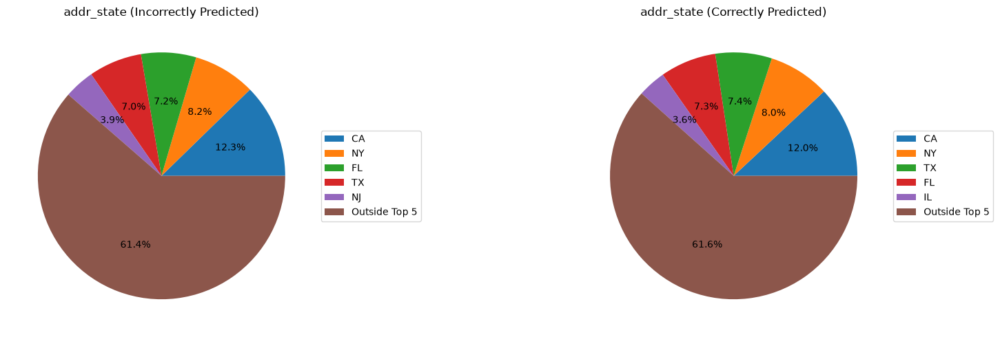

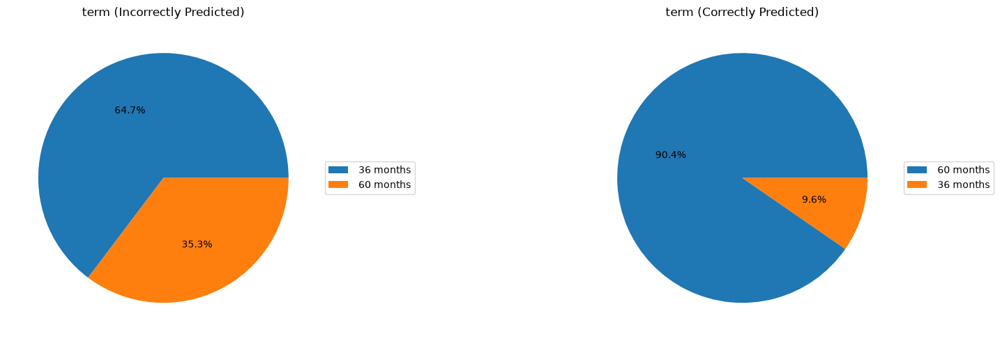

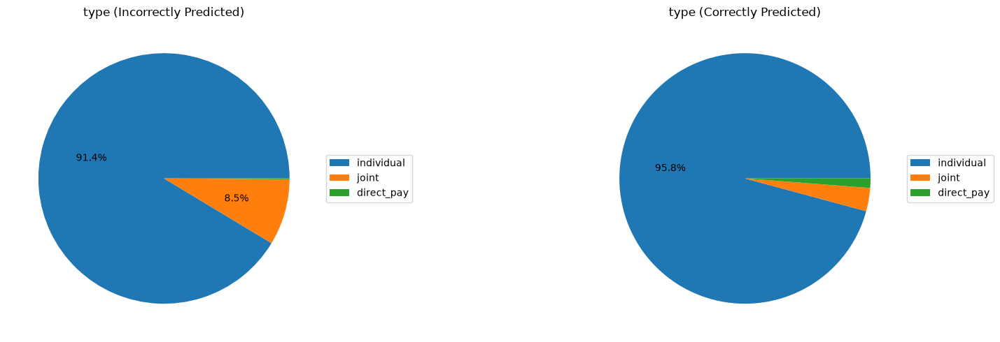

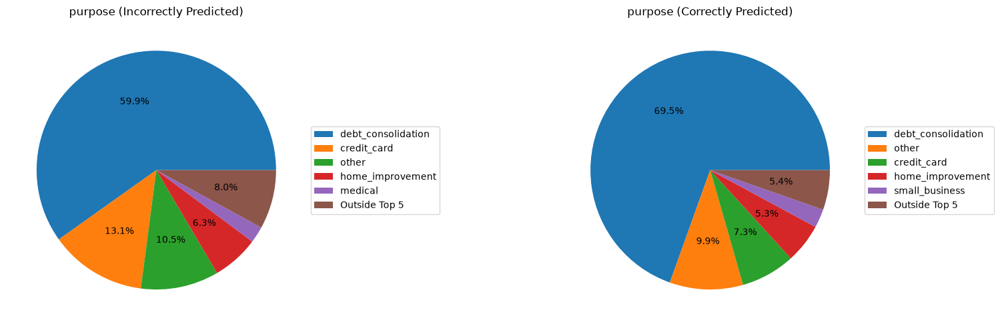

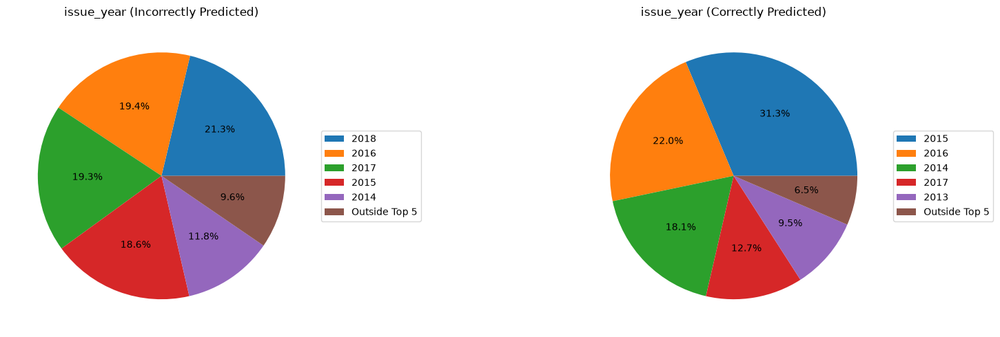

In [60]:
prediction_df = X_test.copy()
prediction_df["actual_label"] = y_test.values
prediction_df["predicted_label"] = y_pred

actual_class_1_df = prediction_df[prediction_df["actual_label"] == 1].copy()
actual_class_1_df["correctly_predicted"] = (
    actual_class_1_df["predicted_label"] == actual_class_1_df["actual_label"]
).map({True: "1", False: "0"})

print("=" * 30 + " correctly_predicted Value Counts " + "=" * 30)
print(actual_class_1_df["correctly_predicted"].value_counts())
print("=" * 60)

for num_col in NUMERICAL_COLUMNS:
    fig, (hist_ax, box_ax) = plt.subplots(1, 2, figsize=(14, 5))
    histogram_by_class(actual_class_1_df, num_col, ax=hist_ax, target_col="correctly_predicted")
    boxplot_by_class(actual_class_1_df, num_col, ax=box_ax, target_col="correctly_predicted")
    plt.savefig(f"documentation/figures/compare_with_pred/pred_round_2/{num_col}_pred.png")
    plt.show()
    plt.close(fig)

cat_columns = CATEGORICAL_COLUMNS.copy()
for cat_col in cat_columns:
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18, 5))
    #bar_chart(actual_class_1_df, cat_col, ax=ax[0], target_col="correctly_predicted", top_n=7)
    pie_chart(actual_class_1_df[actual_class_1_df["correctly_predicted"] == "0"], cat_col, ax=ax[0], top_n=5, autopct=lambda p: f"{p:.1f}%" if p >= 3 else "")
    pie_chart(actual_class_1_df[actual_class_1_df["correctly_predicted"] == "1"], cat_col, ax=ax[1], top_n=5, autopct=lambda p: f"{p:.1f}%" if p >= 3 else "")
    ax[0].set_title(f"{cat_col} (Incorrectly Predicted)")
    ax[1].set_title(f"{cat_col} (Correctly Predicted)")
    plt.tight_layout()
    plt.savefig(f"documentation/figures/compare_with_pred/pred_round_2/{cat_col}_pred.png")
    plt.show()
    plt.close(fig)


We see that using this technique of threshold adjustment, the learnt 'linear relationship' seems to have been resolved. However, it is quite apparent from the purpose column that the model still does not seem to adequately learn the relationships. Furthermore, it is not sensible to use the change in categorical composition before and after as a method for explaining model predictions - either a full categorical breakdown must be done, or one must instead use model explanatory techniques such as SHAP or LIME. 

Furthermore, after further investigation, because of the class imbalance between Grade 0 and Grade 1, it is not sensible to continue the experiment of truncating the top 15% percentile. Instead, the next section will focus on performing feature engineering for the highly skewed columns, and then employ a series of different Random Forest techniques to further improve the accuracy.

# Dataset 2 - Feature Engineering 

Includes further ML improvements later on as well. 

In [64]:
# First create a new dataset that drops loan_amount - too highly correlated with the instalment amount. 

df = pd.read_csv("datasets/25_8.csv")
df.drop(labels=["loan_amount"], axis=1, inplace=True)
df.to_csv("datasets/26_8.csv", index=False)

In [6]:
df = pd.read_csv("datasets/26_8.csv")


# column_normalisation for easier access later 
df.columns = [column.lower() for column in df.columns]

for column in df.columns:
    if df[column].dtype == "str":
        df[column] = df[column].apply(lambda x: x.lower().replace(" ", "_"))

# Feature engineering 
df["leverage"] = (df["tot_cur_bal"] / df["annual_inc"])
df["debt_service_ratio"] = (df.installment / df.annual_inc)

df.drop(labels=["avg_cur_bal", "tot_cur_bal", "annual_inc"], axis=1, inplace=True)

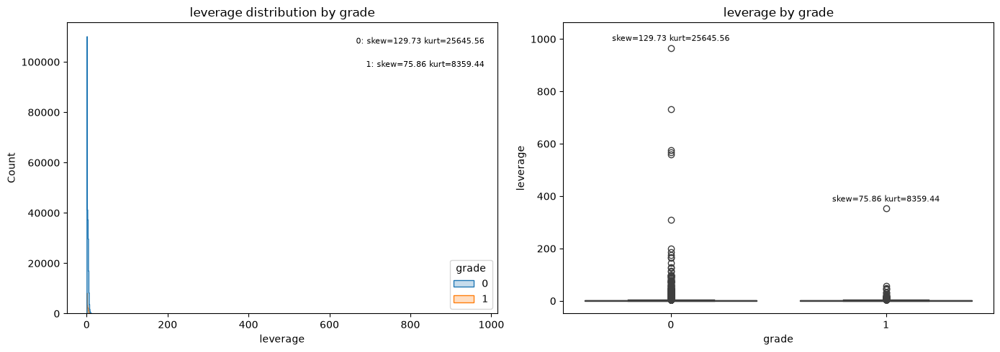

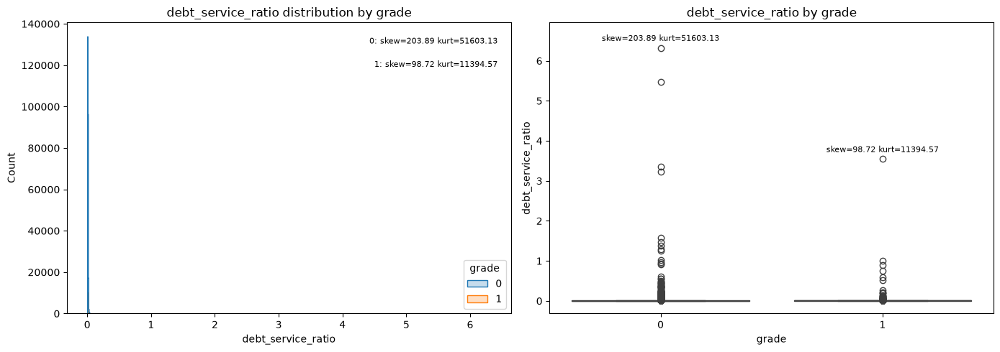

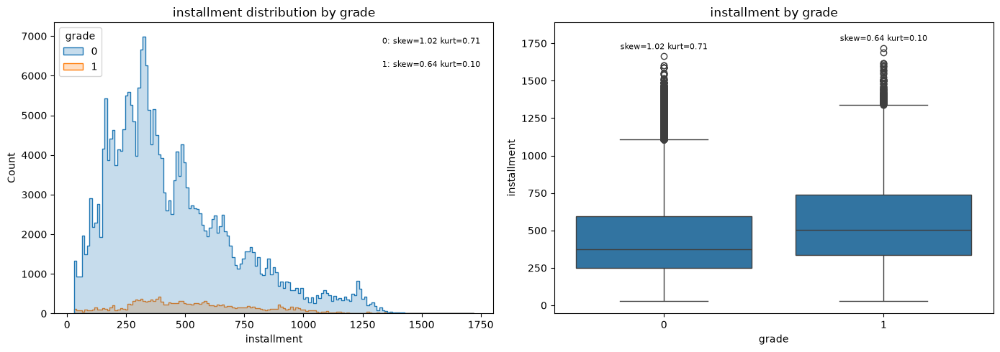

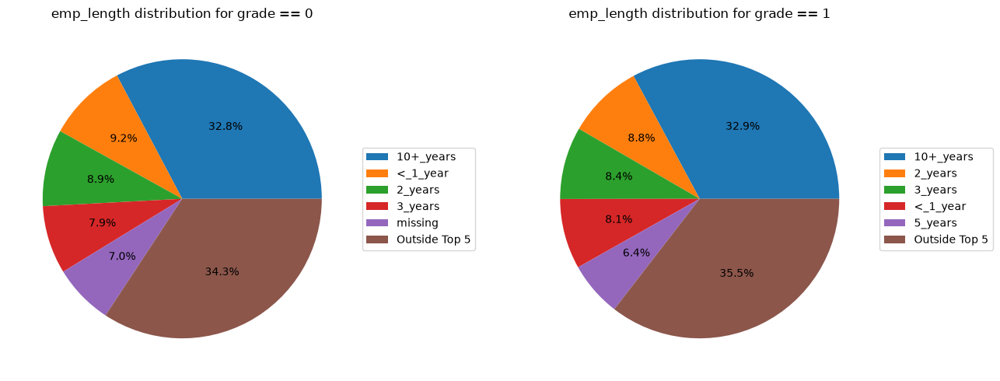

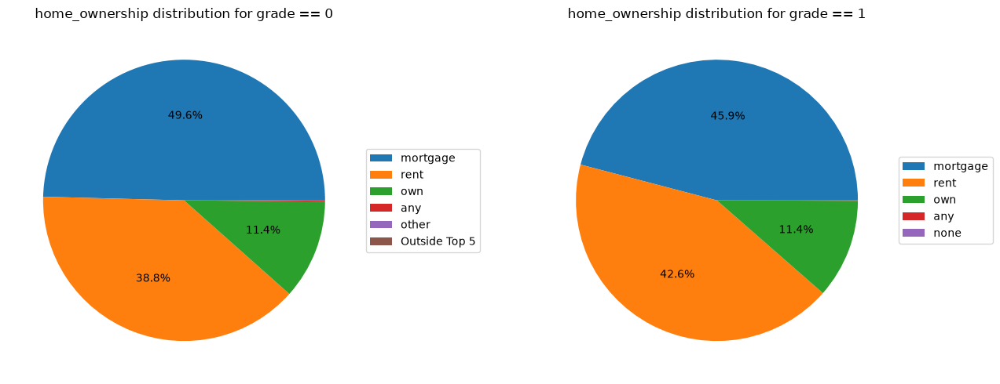

...

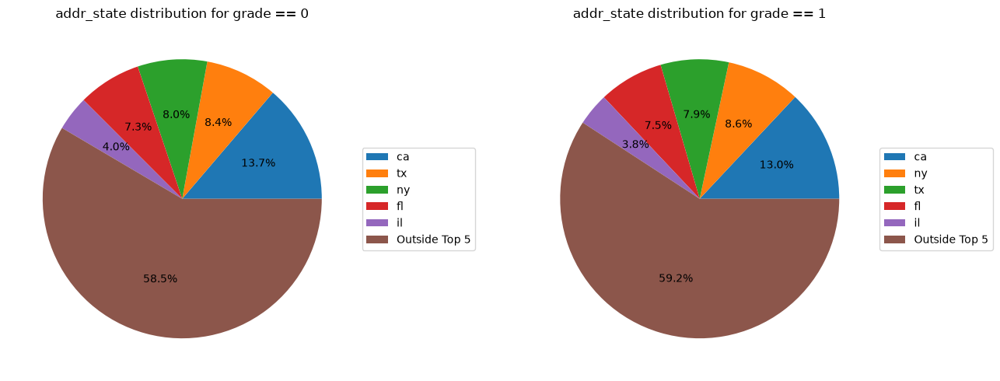

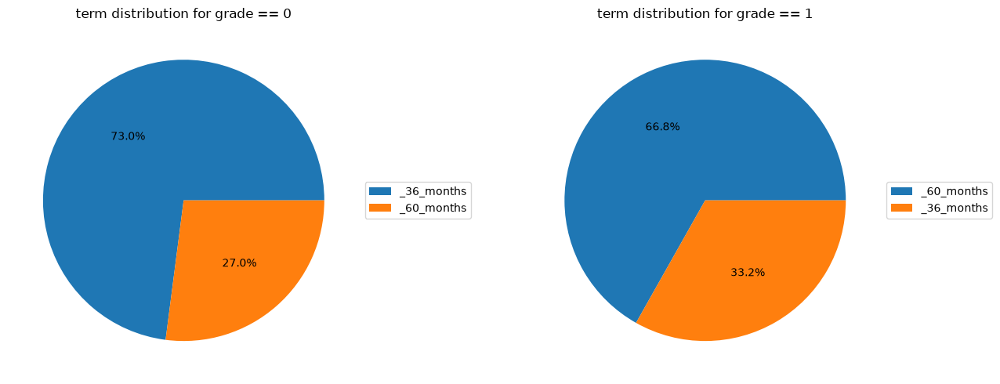

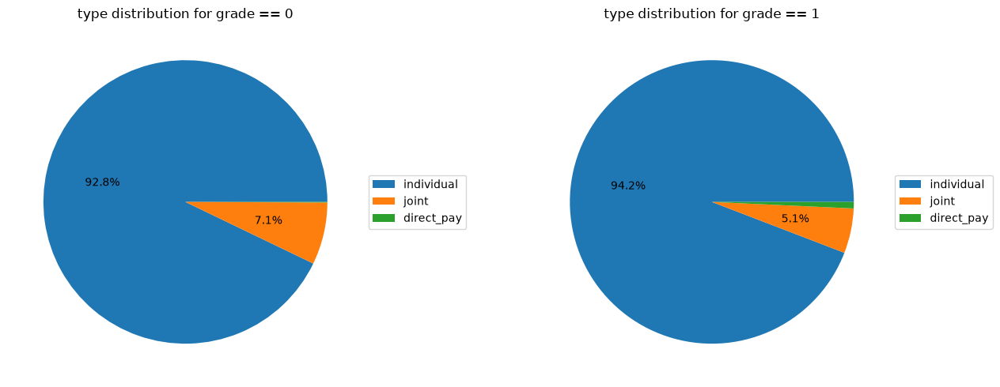

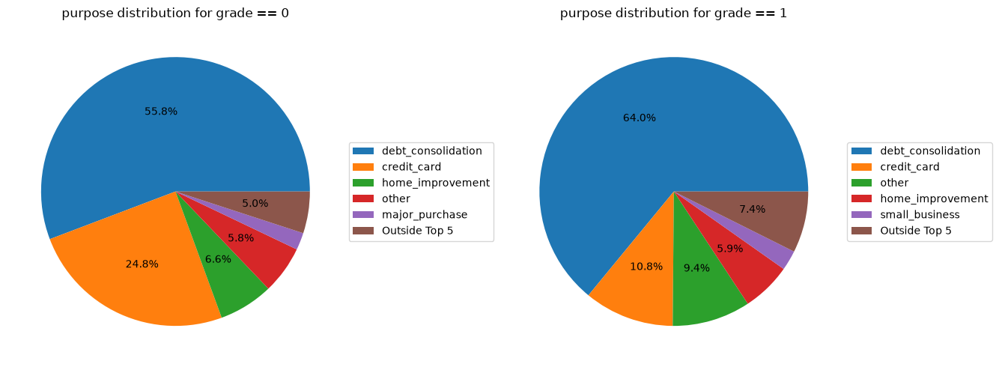

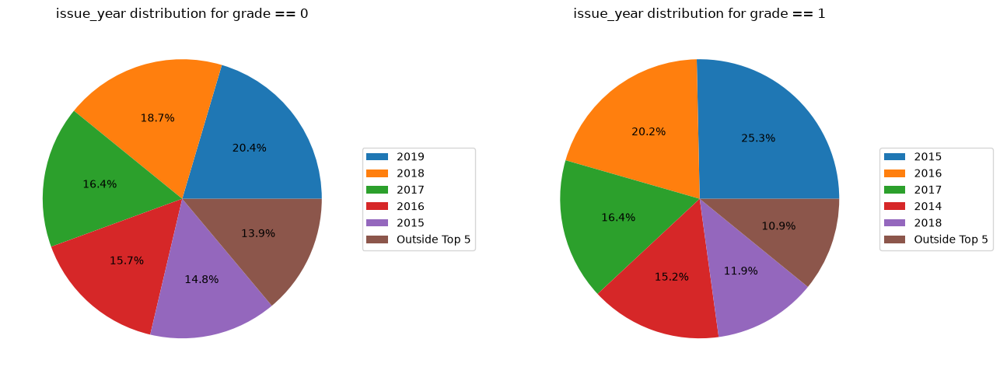

In [81]:
from univariate_analysis import _binary_classes
from palette import CATEGORICAL_PALETTE

NUMERICAL_COLUMNS = ["leverage", "debt_service_ratio", "installment"]
CATEGORICAL_COLUMNS = ["emp_length", "home_ownership", "verification_status", "addr_state", "term", "type", "purpose", "issue_year",  "grade"]

target_col = "grade"
majority_class, minority_class = _binary_classes(df, target_col)
palette = {majority_class: CATEGORICAL_PALETTE[0], minority_class: CATEGORICAL_PALETTE[1]}

cat_columns = [c for c in CATEGORICAL_COLUMNS if c != target_col]

for num_col in NUMERICAL_COLUMNS:
    fig, ax = plt.subplots(1, 2, figsize=(14, 5))
    histogram_by_class(df, num_col, ax=ax[0], target_col=target_col)
    boxplot_by_class(df, num_col, ax=ax[1], target_col=target_col)
    plt.tight_layout()
    plt.show()
    plt.close(fig)

for cat_col in cat_columns:
    fig, ax = plt.subplots(1, 2, figsize=(14, 5))
    pie_chart(
        df[df[target_col] == majority_class], cat_col, ax=ax[0], top_n=5,
        autopct=lambda p: f"{p:.1f}%" if p >= 3 else "",
    )
    pie_chart(
        df[df[target_col] == minority_class], cat_col, ax=ax[1], top_n=5,
        autopct=lambda p: f"{p:.1f}%" if p >= 3 else "",
    )
    ax[0].set_title(f"{cat_col} distribution for {target_col} == {majority_class}")
    ax[1].set_title(f"{cat_col} distribution for {target_col} == {minority_class}")
    plt.tight_layout()
    plt.show()
    plt.close(fig)


In [15]:
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression 
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import OneHotEncoder

y = df["grade"]
X = df.drop(["grade"], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, stratify=y)

CATEGORICAL_FEATURES = X.select_dtypes(include="object").columns.tolist()

preprocessor = ColumnTransformer(
    transformers=[("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False), CATEGORICAL_FEATURES)],
    remainder="passthrough",
)

# Fit the encoder on the training split only, to avoid leaking test-set
# categories into the encoding.
X_train_enc = preprocessor.fit_transform(X_train)
X_test_enc = preprocessor.transform(X_test)

C:\Users\trund\AppData\Local\Temp\ipykernel_14576\495141269.py:13: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  CATEGORICAL_FEATURES = X.select_dtypes(include="object").columns.tolist()


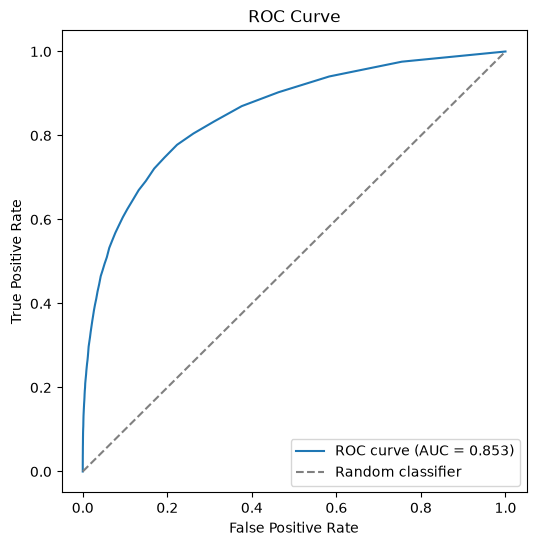

AUC: 0.8532
              precision    recall  f1-score   support

           0       0.97      0.92      0.94     62915
           1       0.35      0.57      0.44      4660

    accuracy                           0.90     67575
   macro avg       0.66      0.75      0.69     67575
weighted avg       0.92      0.90      0.91     67575



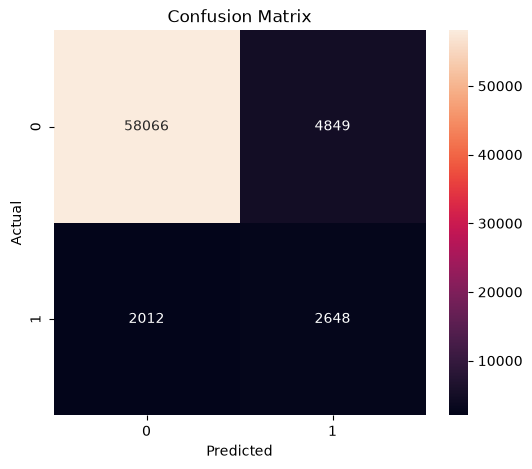

In [7]:
threshold = 0.15

import joblib
from pathlib import Path
from sklearn.metrics import roc_curve, roc_auc_score

clf = RandomForestClassifier()
clf.fit(X_train_enc, y_train)

# The positive class is "1" (Grade 1 / Inferior) - predict_proba's column
# order follows clf.classes_, so locate it explicitly rather than assuming
# index 1.
y_score = clf.predict_proba(X_test_enc)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_score)
auc = roc_auc_score(y_test, y_score)

fig, ax = plt.subplots(figsize=(6, 6))
ax.plot(fpr, tpr, label=f"ROC curve (AUC = {auc:.3f})")
ax.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random classifier")
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.set_title("ROC Curve")
ax.legend(loc="lower right")
plt.show()
plt.close(fig)

print(f"AUC: {auc:.4f}")

y_pred = (y_score > threshold) *  1

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels=clf.classes_)
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=clf.classes_, yticklabels=clf.classes_, ax=ax)
ax.set_title("Confusion Matrix")
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
plt.show()


In [8]:
MODEL_DIR = Path("models")
MODEL_DIR.mkdir(exist_ok=True)

# Save the preprocessor alongside the classifier - the raw X_test features
# need the same one-hot encoding applied before clf.predict will accept them.
joblib.dump(preprocessor, MODEL_DIR / "preprocessor_feature_engineered.joblib")
joblib.dump(clf, MODEL_DIR / "random_forest_classifier_feature_engineered.joblib")

print(f"Wrote {MODEL_DIR / 'preprocessor_feature_engineered.joblib'}")
print(f"Wrote {MODEL_DIR / 'random_forest_classifier_feature_engineered.joblib'}")


Wrote models\preprocessor_feature_engineered.joblib
Wrote models\random_forest_classifier_feature_engineered.joblib


Here we see that post-feature engineering, there was only a slight improvement in the AUC and class 1 recall at the 0.15 class threshold acceptance level
- AUC: 0.846 - > 0.853
- Recall 0.55 -> 0.57. 

So the problem should be fundamentally with the Random Forest algorithm - which is well documented to underpredict the imbalanced class. To solve this issue, the next subexperiment to try is the experiment using the balanced weight Random Forest cited in Chen, Brieman (2004) - _Using Random Forest to Learn Imbalanced Data_. 


Wrote models\balanced_random_forest_classifier.joblib


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.6s finished


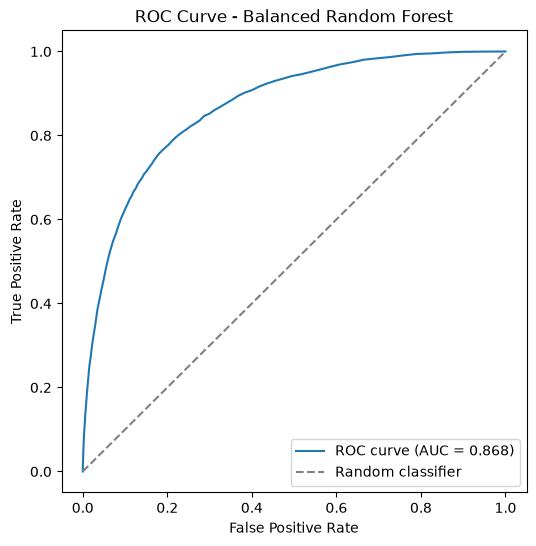

AUC: 0.8680
              precision    recall  f1-score   support

           0       0.99      0.46      0.63     62915
           1       0.12      0.95      0.21      4660

    accuracy                           0.49     67575
   macro avg       0.55      0.71      0.42     67575
weighted avg       0.93      0.49      0.60     67575



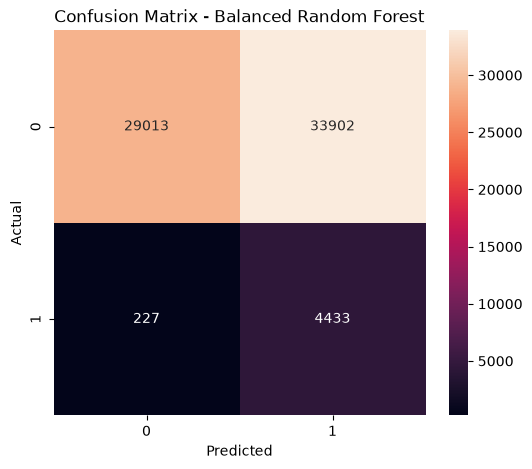

In [ ]:
threshold = 0.15

import joblib
from pathlib import Path
from sklearn.metrics import roc_curve, roc_auc_score
from imblearn.ensemble import BalancedRandomForestClassifier

# Balanced Random Forest (Chen, Liaw, Breiman 2004): rather than reweighting
# the split criterion, each tree's bootstrap sample is drawn so the majority
# class is undersampled down to the minority class count - so every tree
# trains on a roughly balanced sample.
# balanced_clf = BalancedRandomForestClassifier(
#     n_estimators=100,
#     sampling_strategy="all",
#     replacement=True,
#     random_state=42,
#     verbose=1
# )
# balanced_clf.fit(X_train_enc, y_train)

# MODEL_DIR = Path("models")
# MODEL_DIR.mkdir(exist_ok=True)

# joblib.dump(balanced_clf, MODEL_DIR / "balanced_random_forest_classifier.joblib")
# print(f"Wrote {MODEL_DIR / 'balanced_random_forest_classifier.joblib'}")

# The positive class is "1" (Grade 1 / Inferior) - predict_proba's column
# order follows classes_, so locate it explicitly rather than assuming index 1.
#positive_class_idx = list(balanced_clf.classes_).index("1")
y_score = balanced_clf.predict_proba(X_test_enc)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_score)
auc = roc_auc_score(y_test, y_score)

fig, ax = plt.subplots(figsize=(6, 6))
ax.plot(fpr, tpr, label=f"ROC curve (AUC = {auc:.3f})")
ax.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random classifier")
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.set_title("ROC Curve - Balanced Random Forest")
ax.legend(loc="lower right")
plt.show()
plt.close(fig)

print(f"AUC: {auc:.4f}")

y_pred = (y_score > threshold) * 1
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels=balanced_clf.classes_)
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=balanced_clf.classes_, yticklabels=balanced_clf.classes_, ax=ax)
ax.set_title("Confusion Matrix - Balanced Random Forest")
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
plt.show()


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished


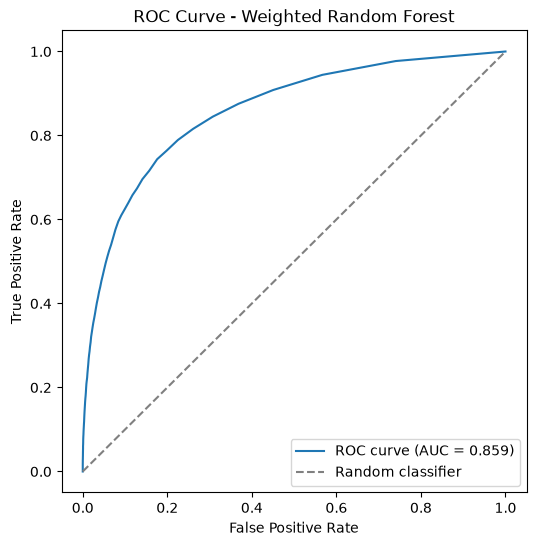

AUC: 0.8586
              precision    recall  f1-score   support

           0       0.97      0.91      0.94     62915
           1       0.33      0.61      0.43      4660

    accuracy                           0.89     67575
   macro avg       0.65      0.76      0.68     67575
weighted avg       0.93      0.89      0.90     67575



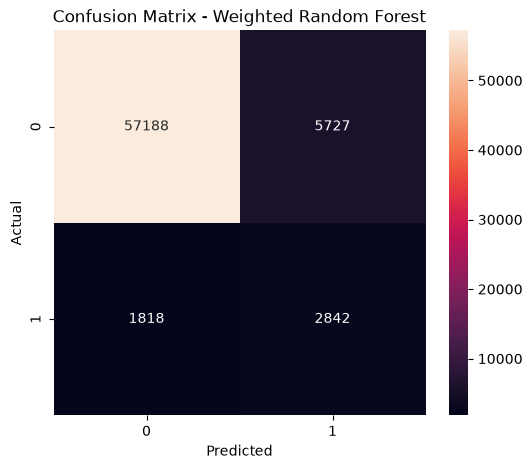

In [10]:
threshold = 0.15

import joblib
from pathlib import Path
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.ensemble import RandomForestClassifier

# Weighted Random Forest (Chen, Liaw, Breiman 2004): rather than resampling,
# reweight the Gini split criterion so misclassifying the minority class
# costs more. "balanced_subsample" recomputes weights per bootstrap sample
# (rather than once globally, as "balanced" does), which is the closer match
# to the paper's cost-sensitive variant for a bagging ensemble.
# weighted_clf = RandomForestClassifier(
#     n_estimators=100,
#     class_weight="balanced_subsample",
#     random_state=42,
#     verbose=1
# )
# weighted_clf.fit(X_train_enc, y_train)

# joblib.dump(weighted_clf, MODEL_DIR / "weighted_random_forest_classifier.joblib")
# print(f"Wrote {MODEL_DIR / 'weighted_random_forest_classifier.joblib'}")

weighted_clf = joblib.load("models/weighted_random_forest_classifier.joblib")
y_score = weighted_clf.predict_proba(X_test_enc)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_score)
auc = roc_auc_score(y_test, y_score)

fig, ax = plt.subplots(figsize=(6, 6))
ax.plot(fpr, tpr, label=f"ROC curve (AUC = {auc:.3f})")
ax.plot([0, 1], [0, 1], linestyle="--", color="gray", label="Random classifier")
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
ax.set_title("ROC Curve - Weighted Random Forest")
ax.legend(loc="lower right")
plt.show()
plt.close(fig)

print(f"AUC: {auc:.4f}")

y_pred = (y_score > threshold)
print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred, labels=weighted_clf.classes_)
fig, ax = plt.subplots(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=weighted_clf.classes_, yticklabels=weighted_clf.classes_, ax=ax)
ax.set_title("Confusion Matrix - Weighted Random Forest")
ax.set_xlabel("Predicted")
ax.set_ylabel("Actual")
plt.show()


The WeightedRandomForest classifier a negligible increase in AUC and decrease in F1-Score, however provided a higher recall than that of the regular RandomForestClassifier. A potential reason for the poor performance of the model may be attributed to the model choosing the high cardinality columns for splitting points over columns that are genuinely predictive. To investigate this, we will plot the feature importances of the Random Forest model.

In [ ]:
from sklearn.inspection import permutation_importance

top_n = 10

# feature_names_in_ isn't set here since weighted_clf was fit on the raw
# encoded numpy array (X_train_enc), not a DataFrame - pull names from the
# preprocessor instead, which knows the one-hot + passthrough column order.
feature_names = preprocessor.get_feature_names_out()

# --- Gini (mean decrease in impurity) feature importances ---
gini_importances = pd.Series(weighted_clf.feature_importances_, index=feature_names)
top_gini = gini_importances.sort_values(ascending=False).head(top_n)

# --- permutation importance ---
perm_result = permutation_importance(
    weighted_clf, X_test_enc, y_test, n_repeats=10, random_state=42, n_jobs=-1,
)
perm_importances = pd.Series(perm_result.importances_mean, index=feature_names)
top_perm = perm_importances.sort_values(ascending=False).head(top_n)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

sns.barplot(x=top_gini.values, y=top_gini.index, ax=ax1, orient="h")
ax1.set_title("Weighted Random Forest: Top 10 Feature Importances (Gini)")
ax1.set_xlabel("Mean Decrease in Impurity")

sns.barplot(x=top_perm.values, y=top_perm.index, ax=ax2, orient="h")
ax2.set_title("Weighted Random Forest: Top 10 Permutation Importances")
ax2.set_xlabel("Mean Decrease in Accuracy")

plt.tight_layout()
plt.show()


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    4.6s finished
